# ECAAL — Multi-Label Classification: Evaluation Notebook (Exp A–G)

Notebook đánh giá toàn diện 7 thí nghiệm ablation (A–G) trên COCO 2017.  
Exp G là thí nghiệm mới nhất: **EfficientNet-B3 + CBAM + ASL + Strong Augmentation**.

**Luồng thực hiện:**
1. Cài đặt môi trường & clone repo
2. Sao chép model đã huấn luyện (A–G)
3. Xác minh dataset COCO 2017
4. Xác minh tập subset (16k train / 1k val / 4k test)
5. Bảng ablation kết quả (mAP / F1)
6. Vẽ training curves (7 thí nghiệm)
7. Đánh giá cross-dataset trên Pascal VOC 2012
8. Đánh giá trên COCO test set (4k held-out) — 7 thí nghiệm
9. So sánh VOC vs COCO test
10. Phân tích overfitting (train vs val vs test) — 7 thí nghiệm
11. Trực quan hóa mẫu dự đoán sai (FP/FN) — 7 thí nghiệm
12. Co-occurrence heatmap (Phi-coefficient) + FP analysis (Exp G)
13. t-SNE feature space visualization (Exp G)
14. Đóng gói kết quả


In [1]:
!pip install timm pycocotools torchmetrics scikit-learn matplotlib seaborn pyyaml tqdm -q
import torch
print(f"GPU: {torch.cuda.get_device_name(0)}")
print(f"VRAM: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")
print(f"PyTorch: {torch.__version__}")


GPU: Tesla T4
VRAM: 15.6 GB
PyTorch: 2.10.0+cu128


## Bước 2: Clone Repository

Clone source code từ GitHub (`src/`, `configs/`, models).


In [2]:
import os, sys
from pathlib import Path

REPO_URL = 'https://github.com/Thinh59/ECAAL.git'
REPO_DIR = Path('/kaggle/working/ECAAL')

if REPO_DIR.exists():
    print('Repo exists — pulling latest...')
    os.system(f'git -C {REPO_DIR} pull')
else:
    print(f'Cloning {REPO_URL} ...')
    ret = os.system(f'git clone {REPO_URL} {REPO_DIR}')
    if ret != 0:
        raise RuntimeError('git clone failed!')

sys.path.insert(0, str(REPO_DIR / 'src'))
print('Repository OK!')


Cloning https://github.com/Thinh59/ECAAL.git ...


Cloning into '/kaggle/working/ECAAL'...


Repository OK!


## Bước 3: Sao Chép Model Đã Huấn Luyện

Copy 7 model (A–G) từ Kaggle dataset vào `/kaggle/working/outputs/`.

| Ký hiệu | Backbone | Loss | CBAM | Điểm khác biệt |
|---|---|---|---|---|
| A | ResNet-50 | BCE | ✗ | Baseline |
| B | ResNet-50 | ASL | ✗ | Loss cải tiến |
| C | EffNet-B0 | ASL | ✓ | Lightweight + attention |
| D | ResNet-50 | Focal | ✗ | Focal loss |
| E | ResNet-50 | ASL | ✓ | ResNet + CBAM |
| F | EffNet-B0 | ASL | ✗ | EffNet không CBAM |
| **G** | **EffNet-B3** | **ASL** | **✓** | **+Strong Augmentation** |


In [3]:
import shutil, json
from pathlib import Path

OUTPUTS_DIR = Path('/kaggle/working/outputs')
OUTPUTS_DIR.mkdir(parents=True, exist_ok=True)

DATASET_ROOT = Path('/kaggle/input/datasets/thinhha59/models') 
RESULTS_DIR  = DATASET_ROOT / 'results'
SRC_SUBSET   = RESULTS_DIR / 'data' / 'coco_subset' 

EXPS = [
    'exp_A_resnet_bce',
    'exp_B_resnet_asl',
    'exp_C_efficientnet_cbam_asl',
    'exp_D_resnet_focal',
    'exp_E_resnet_cbam_asl',
    'exp_F_efficientnet_asl',
    'exp_G_efficientnet_b3_cbam_asl',
]

print(f"Checking models in: {RESULTS_DIR}")
for exp in EXPS:
    src = RESULTS_DIR / exp
    dst = OUTPUTS_DIR / exp
    dst.mkdir(parents=True, exist_ok=True)
    for fname in ['best.pth', 'log.json']:
        src_f = src / fname
        dst_f = dst / fname
        if src_f.exists() and not dst_f.exists():
            shutil.copy2(src_f, dst_f)
            print(f'  Copied {exp}/{fname}')
        elif dst_f.exists():
            print(f'  Already exists: {exp}/{fname}')
        else:
            print(f'  MISSING: {src_f}')

SUBSET_DIR = Path('/kaggle/working/data/coco_subset')
SUBSET_DIR.mkdir(parents=True, exist_ok=True)
print(f"\nChecking subset IDs in: {SRC_SUBSET}")
for fname in ['subset_train_ids.json', 'subset_val_ids.json', 'subset_test_ids.json']:
    src_f = SRC_SUBSET / fname
    dst_f = SUBSET_DIR / fname
    if src_f.exists() and not dst_f.exists():
        shutil.copy2(src_f, dst_f)
    elif dst_f.exists():
        pass
    else:
        raise FileNotFoundError(f'CRITICAL: {src_f} not found!')
print('\nSetup done!')


Checking models in: /kaggle/input/datasets/thinhha59/models/results
  Copied exp_A_resnet_bce/best.pth
  Copied exp_A_resnet_bce/log.json
  Copied exp_B_resnet_asl/best.pth
  Copied exp_B_resnet_asl/log.json
  Copied exp_C_efficientnet_cbam_asl/best.pth
  Copied exp_C_efficientnet_cbam_asl/log.json
  Copied exp_D_resnet_focal/best.pth
  Copied exp_D_resnet_focal/log.json
  Copied exp_E_resnet_cbam_asl/best.pth
  Copied exp_E_resnet_cbam_asl/log.json
  Copied exp_F_efficientnet_asl/best.pth
  Copied exp_F_efficientnet_asl/log.json
  Copied exp_G_efficientnet_b3_cbam_asl/best.pth
  Copied exp_G_efficientnet_b3_cbam_asl/log.json

Checking subset IDs in: /kaggle/input/datasets/thinhha59/models/results/data/coco_subset

Setup done!


## Bước 4: Xác Minh Dataset COCO 2017

**Trước khi chạy:** Add Data → coco-2017-dataset (awsaf49)


In [4]:
coco_root = '/kaggle/input/datasets/awsaf49/coco-2017-dataset/coco2017'
import os
if os.path.exists(coco_root):
    print('COCO 2017 dataset found')
    for name, path in [
        ('train annotations', f'{coco_root}/annotations/instances_train2017.json'),
        ('val annotations',   f'{coco_root}/annotations/instances_val2017.json'),
        ('train2017/',        f'{coco_root}/train2017'),
        ('val2017/',          f'{coco_root}/val2017'),
    ]:
        print(f"  {'OK' if os.path.exists(path) else 'MISSING'} {name}")
else:
    print(f'COCO not found at {coco_root}')
    print('Add Data -> coco-2017-dataset (awsaf49)')


COCO 2017 dataset found
  OK train annotations
  OK val annotations
  OK train2017/
  OK val2017/


## Bước 5: Xác Minh Tập Subset (16k train / 1k val / 4k test)

Dùng đúng split từ lần huấn luyện gốc để tránh data leakage.


In [5]:
import json
from pathlib import Path

SUBSET_DIR = Path('/kaggle/working/data/coco_subset')

train_f = SUBSET_DIR / 'subset_train_ids.json'
val_f   = SUBSET_DIR / 'subset_val_ids.json'
test_f  = SUBSET_DIR / 'subset_test_ids.json'

missing = [f.name for f in [train_f, val_f, test_f] if not f.exists()]
if missing:
    raise FileNotFoundError(
        f"CRITICAL: Missing split files: {missing}. "
        f"These MUST come from the original training run (results/results/data/coco_subset/). "
        f"Cell 3 should have copied them — check if RESULTS_DIR path is correct."
    )

print('Split files verified (from original training run):' )
print(f'  train: {len(json.load(open(train_f)))} ids')
print(f'  val:   {len(json.load(open(val_f)))} ids')
print(f'  test:  {len(json.load(open(test_f)))} ids')
print('OK — using exact same splits as training!')


Split files verified (from original training run):
  train: 16000 ids
  val:   1000 ids
  test:  3952 ids
OK — using exact same splits as training!


## Bước 6: Bảng Kết Quả Ablation Study

So sánh mAP và Macro F1 của 7 thí nghiệm tại epoch tốt nhất (theo val mAP).


In [6]:
import json, os
import pandas as pd

base = '/kaggle/working/outputs'
exps = {
    'A: ResNet50+BCE':       'exp_A_resnet_bce/log.json',
    'D: ResNet50+Focal':     'exp_D_resnet_focal/log.json',
    'B: ResNet50+ASL':       'exp_B_resnet_asl/log.json',
    'E: ResNet50+CBAM+ASL':  'exp_E_resnet_cbam_asl/log.json',
    'F: EffNet+ASL':         'exp_F_efficientnet_asl/log.json',
    'C: EffNet+CBAM+ASL':    'exp_C_efficientnet_cbam_asl/log.json',
    'G: EffNet+CBAM+ASL+Aug': 'exp_G_efficientnet_b3_cbam_asl/log.json',
}

rows = []
logs = {}
for name, rel in exps.items():
    path = os.path.join(base, rel)
    if not os.path.exists(path):
        print(f'WARNING: {name} log not found')
        continue
    records = json.load(open(path))
    logs[name] = records
    best = max(records, key=lambda r: r.get('mAP', 0))
    rows.append({
        'Experiment': name,
        'mAP': f"{best['mAP']:.4f}",
        'Macro F1': f"{best['macro_f1']:.4f}",
        'Best Epoch': best['epoch'],
    })

print("\n" + "="*65)
print("ABLATION STUDY RESULTS")
print("="*65)
print(pd.DataFrame(rows).to_string(index=False))
print("="*65)



ABLATION STUDY RESULTS
            Experiment    mAP Macro F1  Best Epoch
       A: ResNet50+BCE 0.6908   0.6201          16
     D: ResNet50+Focal 0.7009   0.6286          10
       B: ResNet50+ASL 0.7107   0.5886           8
  E: ResNet50+CBAM+ASL 0.7129   0.6167          14
         F: EffNet+ASL 0.6326   0.5460           6
    C: EffNet+CBAM+ASL 0.6364   0.5651           8
G: EffNet+CBAM+ASL+Aug 0.7188   0.6989          10


## Bước 7: Vẽ Training Curves

Biểu đồ val mAP và train loss theo epoch cho cả 7 thí nghiệm — lưu ra `ablation_curves.png`.


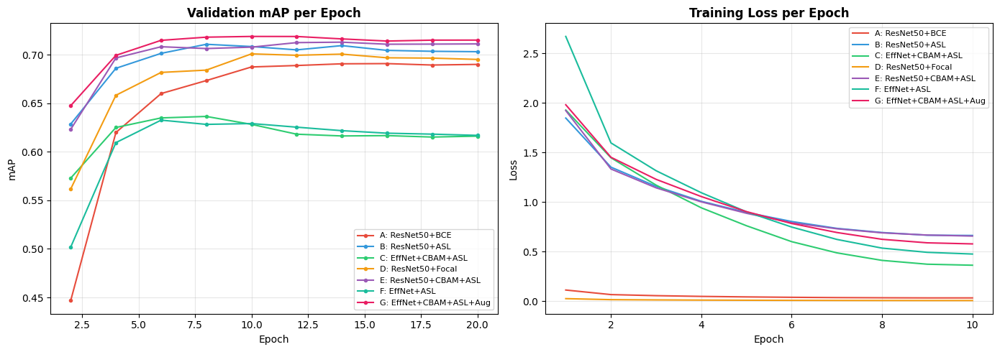

Saved ablation_curves.png


In [7]:
import matplotlib.pyplot as plt
from pathlib import Path

OUTPUTS_DIR = Path('/kaggle/working/outputs')
exp_list = [
    ('A: ResNet50+BCE',      'exp_A_resnet_bce'),
    ('B: ResNet50+ASL',      'exp_B_resnet_asl'),
    ('C: EffNet+CBAM+ASL',   'exp_C_efficientnet_cbam_asl'),
    ('D: ResNet50+Focal',    'exp_D_resnet_focal'),
    ('E: ResNet50+CBAM+ASL', 'exp_E_resnet_cbam_asl'),
    ('F: EffNet+ASL',        'exp_F_efficientnet_asl'),
    ('G: EffNet+CBAM+ASL+Aug', 'exp_G_efficientnet_b3_cbam_asl'),
]

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
colors = ['#e74c3c','#3498db','#2ecc71','#f39c12','#9b59b6','#1abc9c','#e91e63']

for (name, exp_dir), color in zip(exp_list, colors):
    log_path = OUTPUTS_DIR / exp_dir / 'log.json'
    if not log_path.exists():
        continue
    records = json.load(open(log_path))
    epochs = [r['epoch'] for r in records if 'mAP' in r]
    maps   = [r['mAP']   for r in records if 'mAP' in r]
    losses = [r.get('train_loss', None) for r in records]

    axes[0].plot(epochs, maps, marker='o', ms=3, label=name, color=color)
    train_epochs = list(range(1, len(losses)+1))
    axes[1].plot(train_epochs, losses, label=name, color=color)

axes[0].set_title('Validation mAP per Epoch', fontsize=12, fontweight='bold')
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('mAP')
axes[0].legend(fontsize=8); axes[0].grid(alpha=0.3)

axes[1].set_title('Training Loss per Epoch', fontsize=12, fontweight='bold')
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Loss')
axes[1].legend(fontsize=8); axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig(str(OUTPUTS_DIR / 'ablation_curves.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved ablation_curves.png')


## Bước 8: Đánh Giá Cross-Dataset trên Pascal VOC 2012

**Thêm data:** Add Data → gopalbhattrai/pascal-voc-2012-dataset

Test khả năng tổng quát hóa: model huấn luyện trên COCO, đánh giá thẳng trên VOC (không fine-tune).


In [8]:
import os
from pathlib import Path

VOC_ROOT    = '/kaggle/input/datasets/gopalbhattrai/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test'
OUTPUTS_DIR = '/kaggle/working/outputs'

if os.path.exists(VOC_ROOT):
    print('Starting VOC 2012 cross-evaluation...')
    !python /kaggle/working/ECAAL/src/cross_evaluate.py --voc-root {VOC_ROOT} --outputs-dir {OUTPUTS_DIR}
else:
    print(f'VOC dataset not found at {VOC_ROOT}')
    print('Add Data -> gopalbhattrai/pascal-voc-2012-dataset')


Starting VOC 2012 cross-evaluation...
[VOC 2012 test] 10,991 images loaded

Đang đánh giá VOC cho: exp_F_efficientnet_asl
[Model] efficientnet_b0 | CBAM=False | Dropout=0.3 | Params=3.62M | FeatChannels=320
DEBUG: Mapping size: 20 (Expected: 20)
exp_F_efficientnet_asl: VOC mAP = 0.0000

Đang đánh giá VOC cho: exp_C_efficientnet_cbam_asl
[Model] efficientnet_b0 | CBAM=True | Dropout=0.3 | Params=3.63M | FeatChannels=320
DEBUG: Mapping size: 20 (Expected: 20)
exp_C_efficientnet_cbam_asl: VOC mAP = 0.0000

Đang đánh giá VOC cho: exp_G_efficientnet_b3_cbam_asl
[Model] efficientnet_b0 | CBAM=True | Dropout=0.3 | Params=3.63M | FeatChannels=320
Lỗi khi đánh giá exp_G_efficientnet_b3_cbam_asl: Error(s) in loading state_dict for MultiLabelModel:
	Unexpected key(s) in state_dict: "backbone.blocks.0.1.conv_dw.weight", "backbone.blocks.0.1.bn1.weight", "backbone.blocks.0.1.bn1.bias", "backbone.blocks.0.1.bn1.running_mean", "backbone.blocks.0.1.bn1.running_var", "backbone.blocks.0.1.bn1.num_batche

## Bước 9: Đánh Giá Trên COCO Test Set (4k ảnh held-out)

4k ảnh tách riêng từ đầu, không dùng trong train/val. Chạy cả **7 thí nghiệm** để có đủ dữ liệu so sánh ở Bước 10.


In [9]:
import torch, json
import numpy as np
import pandas as pd
from pathlib import Path
import sys

sys.path.insert(0, str(REPO_DIR / 'src'))
from models import build_model
from dataset import COCOMultiLabelDataset, get_val_transform
from evaluate import compute_map, compute_f1

COCO_ROOT   = '/kaggle/input/datasets/awsaf49/coco-2017-dataset/coco2017'
OUTPUTS_DIR = Path('/kaggle/working/outputs')
SUBSET_DIR  = Path('/kaggle/working/data/coco_subset')
DEVICE      = 'cuda'

test_ids = json.load(open(SUBSET_DIR / 'subset_test_ids.json'))
print(f'Test set: {len(test_ids)} images from val2017')

transform   = get_val_transform(img_size=224)
test_ds     = COCOMultiLabelDataset(COCO_ROOT, 'val', transform, test_ids)
test_loader = torch.utils.data.DataLoader(test_ds, batch_size=64, num_workers=2, pin_memory=True)

EXPERIMENTS = [
    ('A: ResNet50+BCE',       'exp_A_resnet_bce',              'resnet50',          False),
    ('B: ResNet50+ASL',       'exp_B_resnet_asl',              'resnet50',          False),
    ('C: EffNet+CBAM+ASL',    'exp_C_efficientnet_cbam_asl',   'efficientnet_b0',   True),
    ('D: ResNet50+Focal',     'exp_D_resnet_focal',            'resnet50',          False),
    ('E: ResNet50+CBAM+ASL',  'exp_E_resnet_cbam_asl',         'resnet50',          True),
    ('F: EffNet+ASL',         'exp_F_efficientnet_asl',        'efficientnet_b0',   False),
    ('G: EffNet+CBAM+ASL+Aug','exp_G_efficientnet_b3_cbam_asl','efficientnet_b3',   True),
]

coco_test_results = []
for name, exp_dir, backbone, use_cbam in EXPERIMENTS:
    pth = OUTPUTS_DIR / exp_dir / 'best.pth'
    if not pth.exists():
        print(f'  skip {name} (no best.pth)'); continue
    print(f'\nEvaluating COCO test: {name}')
    model = build_model({'backbone': backbone, 'use_cbam': use_cbam,
                         'num_classes': 80, 'pretrained': False}).to(DEVICE)
    ckpt = torch.load(pth, map_location=DEVICE, weights_only=False)
    model.load_state_dict(ckpt['model'] if isinstance(ckpt, dict) and 'model' in ckpt else ckpt)
    model.eval()
    all_p, all_t = [], []
    with torch.no_grad():
        for imgs, tgts in test_loader:
            p = torch.sigmoid(model(imgs.to(DEVICE))).cpu().numpy()
            all_p.append(p); all_t.append(tgts.numpy())
    P = np.concatenate(all_p); T = np.concatenate(all_t)
    m = {**compute_map(T, P), **compute_f1(T, P)}
    coco_test_results.append({
        'Experiment': name, 'exp_dir': exp_dir,
        'COCO_Test_mAP': round(m['mAP'], 4),
        'COCO_Test_Macro_F1': round(m['macro_f1'], 4),
        'COCO_Test_Micro_F1': round(m['micro_f1'], 4),
    })
    print(f"  mAP={m['mAP']:.4f} | F1={m['macro_f1']:.4f}")

df = pd.DataFrame([{k:v for k,v in r.items() if k!='exp_dir'} for r in coco_test_results])
df.to_csv(OUTPUTS_DIR / 'coco_test_evaluation.csv', index=False)
print('\n' + '='*65)
print('COCO TEST RESULTS (4k held-out from val2017)')
print('='*65)
print(df.to_string(index=False))
print('='*65)


Test set: 3952 images from val2017
[COCO 2017 val] 3,952 images loaded

Evaluating COCO test: A: ResNet50+BCE
[Model] resnet50 | CBAM=False | Dropout=0.3 | Params=23.67M | FeatChannels=2048
  mAP=0.7081 | F1=0.6836

Evaluating COCO test: B: ResNet50+ASL
[Model] resnet50 | CBAM=False | Dropout=0.3 | Params=23.67M | FeatChannels=2048
  mAP=0.7228 | F1=0.6927

Evaluating COCO test: C: EffNet+CBAM+ASL
[Model] efficientnet_b0 | CBAM=True | Dropout=0.3 | Params=3.63M | FeatChannels=320
  mAP=0.6537 | F1=0.6407

Evaluating COCO test: D: ResNet50+Focal
[Model] resnet50 | CBAM=False | Dropout=0.3 | Params=23.67M | FeatChannels=2048
  mAP=0.7100 | F1=0.6858

Evaluating COCO test: E: ResNet50+CBAM+ASL
[Model] resnet50 | CBAM=True | Dropout=0.3 | Params=24.20M | FeatChannels=2048
  mAP=0.7223 | F1=0.6961

Evaluating COCO test: F: EffNet+ASL
[Model] efficientnet_b0 | CBAM=False | Dropout=0.3 | Params=3.62M | FeatChannels=320
  mAP=0.6463 | F1=0.6281

Evaluating COCO test: G: EffNet+CBAM+ASL+Aug
[Mo

## Bước 10: So Sánh Cross-Dataset — VOC vs COCO Test

Merge kết quả Bước 8 và Bước 9, so sánh mAP trên hai domain.

> **Lưu ý:** VOC có 20 class, COCO có 80 class. VOC score đo khả năng tổng quát hóa, không dùng để so sánh tuyệt đối với COCO.



CROSS-DATASET: COCO Test vs VOC (cross-dataset)
            Experiment  COCO_Test_mAP  COCO_Test_Macro_F1  VOC_mAP  VOC_Macro_F1
       B: ResNet50+ASL         0.7228              0.6927      0.0           0.0
  E: ResNet50+CBAM+ASL         0.7223              0.6961      0.0           0.0
     D: ResNet50+Focal         0.7100              0.6858      0.0           0.0
       A: ResNet50+BCE         0.7081              0.6836      0.0           0.0
G: EffNet+CBAM+ASL+Aug         0.6753              0.6603      NaN           NaN
    C: EffNet+CBAM+ASL         0.6537              0.6407      0.0           0.0
         F: EffNet+ASL         0.6463              0.6281      0.0           0.0


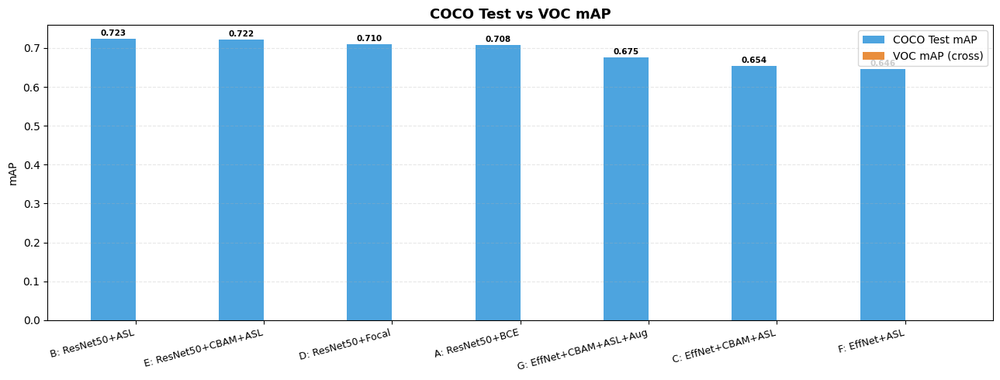

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

OUTPUTS_DIR = Path('/kaggle/working/outputs')
voc_csv  = OUTPUTS_DIR / 'voc_cross_evaluation.csv'
coco_csv = OUTPUTS_DIR / 'coco_test_evaluation.csv'

if not voc_csv.exists() or not coco_csv.exists():
    missing = []
    if not voc_csv.exists():  missing.append('voc (Cell 16)')
    if not coco_csv.exists(): missing.append('coco_test (Cell 17)')
    print(f'Missing: {", ".join(missing)}')
else:
    df_voc  = pd.read_csv(voc_csv)
    df_coco = pd.read_csv(coco_csv)

    name_map = {
        'exp_A_resnet_bce':           'A: ResNet50+BCE',
        'exp_B_resnet_asl':           'B: ResNet50+ASL',
        'exp_C_efficientnet_cbam_asl':'C: EffNet+CBAM+ASL',
        'exp_D_resnet_focal':         'D: ResNet50+Focal',
        'exp_E_resnet_cbam_asl':      'E: ResNet50+CBAM+ASL',
        'exp_F_efficientnet_asl':     'F: EffNet+ASL',
        'exp_G_efficientnet_b3_cbam_asl': 'G: EffNet+CBAM+ASL+Aug',
    }
    if df_voc['Experiment'].str.startswith('exp_').any():
        df_voc['Experiment'] = df_voc['Experiment'].map(lambda x: name_map.get(x, x))

    df_m = df_coco[['Experiment','COCO_Test_mAP','COCO_Test_Macro_F1']].merge(
        df_voc[['Experiment','VOC_mAP','VOC_Macro_F1']], on='Experiment', how='outer'
    ).sort_values('COCO_Test_mAP', ascending=False).reset_index(drop=True)

    print('\n' + '='*75)
    print('CROSS-DATASET: COCO Test vs VOC (cross-dataset)')
    print('='*75)
    print(df_m.to_string(index=False))
    print('='*75)
    df_m.to_csv(OUTPUTS_DIR / 'cross_dataset_comparison.csv', index=False)

    fig, ax = plt.subplots(figsize=(13, 5))
    x = range(len(df_m)); w = 0.35
    b1 = ax.bar([i-w/2 for i in x], df_m['COCO_Test_mAP'].fillna(0), w,
                label='COCO Test mAP', color='#3498db', alpha=0.88)
    b2 = ax.bar([i+w/2 for i in x], df_m['VOC_mAP'].fillna(0), w,
                label='VOC mAP (cross)', color='#e67e22', alpha=0.88)
    ax.set_xticks(list(x))
    ax.set_xticklabels(df_m['Experiment'], rotation=15, ha='right', fontsize=9)
    ax.set_ylabel('mAP'); ax.set_title('COCO Test vs VOC mAP', fontsize=13, fontweight='bold')
    ax.legend(); ax.grid(axis='y', alpha=0.3, linestyle='--')
    for bar in list(b1)+list(b2):
        h = bar.get_height()
        if h > 0: ax.text(bar.get_x()+bar.get_width()/2, h+0.004, f'{h:.3f}',
                          ha='center', va='bottom', fontsize=7.5, fontweight='bold')
    plt.tight_layout()
    plt.savefig(str(OUTPUTS_DIR / 'cross_dataset_bar.png'), dpi=150, bbox_inches='tight')
    plt.show()


## Bước 11: Phân Tích Overfitting — Train vs Val vs Test

So sánh mAP trên 3 split cho cả **7 thí nghiệm**. Gap > 0.08 → dấu hiệu overfit đáng lo ngại.


In [11]:
import torch, json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import sys

sys.path.insert(0, str(REPO_DIR / 'src'))
from models import build_model
from dataset import COCOMultiLabelDataset, get_val_transform
from evaluate import compute_map, compute_f1

COCO_ROOT   = '/kaggle/input/datasets/awsaf49/coco-2017-dataset/coco2017'
OUTPUTS_DIR = Path('/kaggle/working/outputs')
SUBSET_DIR  = Path('/kaggle/working/data/coco_subset')
DEVICE      = 'cuda'

transform = get_val_transform(img_size=224)
train_ids = json.load(open(SUBSET_DIR / 'subset_train_ids.json'))
train_ds  = COCOMultiLabelDataset(COCO_ROOT, 'train', transform, train_ids)
print(f'Train eval: {len(train_ds.samples)} samples')
train_loader = torch.utils.data.DataLoader(train_ds, batch_size=64, num_workers=2, pin_memory=True)

EXPERIMENTS = [
    ('A: ResNet50+BCE',       'exp_A_resnet_bce',              'resnet50',          False),
    ('B: ResNet50+ASL',       'exp_B_resnet_asl',              'resnet50',          False),
    ('C: EffNet+CBAM+ASL',    'exp_C_efficientnet_cbam_asl',   'efficientnet_b0',   True),
    ('D: ResNet50+Focal',     'exp_D_resnet_focal',            'resnet50',          False),
    ('E: ResNet50+CBAM+ASL',  'exp_E_resnet_cbam_asl',         'resnet50',          True),
    ('F: EffNet+ASL',         'exp_F_efficientnet_asl',        'efficientnet_b0',   False),
    ('G: EffNet+CBAM+ASL+Aug','exp_G_efficientnet_b3_cbam_asl','efficientnet_b3',   True),
]

coco_test_csv = OUTPUTS_DIR / 'coco_test_evaluation.csv'
df_test = pd.read_csv(coco_test_csv) if coco_test_csv.exists() else None

rows = []
for name, exp_dir, backbone, use_cbam in EXPERIMENTS:
    pth = OUTPUTS_DIR / exp_dir / 'best.pth'
    log = OUTPUTS_DIR / exp_dir / 'log.json'
    if not pth.exists(): continue
    print(f'\nTrain-eval: {name}')
    model = build_model({'backbone': backbone, 'use_cbam': use_cbam,
                         'num_classes': 80, 'pretrained': False}).to(DEVICE)
    ckpt = torch.load(pth, map_location=DEVICE, weights_only=False)
    model.load_state_dict(ckpt['model'] if isinstance(ckpt, dict) and 'model' in ckpt else ckpt)
    model.eval()
    all_p, all_t = [], []
    with torch.no_grad():
        for imgs, tgts in train_loader:
            p = torch.sigmoid(model(imgs.to(DEVICE))).cpu().numpy()
            all_p.append(p); all_t.append(tgts.numpy())
    P = np.concatenate(all_p); T = np.concatenate(all_t)
    tr = {**compute_map(T, P), **compute_f1(T, P)}

    val_map = val_f1 = None
    if log.exists():
        best = max(json.load(open(log)), key=lambda r: r.get('mAP', 0))
        val_map = round(best.get('mAP', 0), 4)
        val_f1  = round(best.get('macro_f1', 0), 4)

    test_map = test_f1 = None
    if df_test is not None:
        r = df_test[df_test['Experiment'] == name]
        if not r.empty:
            test_map = r.iloc[0].get('COCO_Test_mAP')
            test_f1  = r.iloc[0].get('COCO_Test_Macro_F1')

    train_map = round(tr['mAP'], 4)
    gap_test  = round(train_map - test_map, 4) if test_map else None

    def status(g):
        if g is None: return '?'
        return 'OK' if abs(g) < 0.04 else ('Nhe' if abs(g) < 0.08 else 'OVERFIT')

    print(f'  Train={train_map:.4f} Val={val_map} Test={test_map} Gap={gap_test} {status(gap_test)}')
    rows.append({
        'Experiment': name,
        'Train_mAP': train_map, 'Val_mAP': val_map, 'Test_mAP': test_map,
        'Gap_test': gap_test,
        'Train_F1': round(tr['macro_f1'], 4), 'Val_F1': val_f1, 'Test_F1': test_f1,
    })

if not rows:
    print('No results')
else:
    df = pd.DataFrame(rows).sort_values('Test_mAP', ascending=False, na_position='last').reset_index(drop=True)
    print('\n' + '='*80)
    print('OVERFITTING ANALYSIS: Train vs Val vs Test')
    print('='*80)
    print(df[['Experiment','Train_mAP','Val_mAP','Test_mAP','Gap_test']].to_string(index=False))
    print('='*80)
    for _, r in df.iterrows():
        g = r['Gap_test']
        if g is not None:
            s = 'OK' if abs(g)<0.04 else ('Nhe' if abs(g)<0.08 else 'OVERFIT')
            print(f"  {r['Experiment']:<28} gap={g:+.4f}  {s}")
    df.to_csv(OUTPUTS_DIR / 'overfitting_analysis.csv', index=False)
    print('Saved overfitting_analysis.csv')


[COCO 2017 train] 16,000 images loaded
Train eval: 16000 samples

Train-eval: A: ResNet50+BCE
[Model] resnet50 | CBAM=False | Dropout=0.3 | Params=23.67M | FeatChannels=2048
  Train=0.8706 Val=0.6908 Test=0.7081 Gap=0.1625 OVERFIT

Train-eval: B: ResNet50+ASL
[Model] resnet50 | CBAM=False | Dropout=0.3 | Params=23.67M | FeatChannels=2048
  Train=0.8739 Val=0.7107 Test=0.7228 Gap=0.1511 OVERFIT

Train-eval: C: EffNet+CBAM+ASL
[Model] efficientnet_b0 | CBAM=True | Dropout=0.3 | Params=3.63M | FeatChannels=320
  Train=0.9168 Val=0.6364 Test=0.6537 Gap=0.2631 OVERFIT

Train-eval: D: ResNet50+Focal
[Model] resnet50 | CBAM=False | Dropout=0.3 | Params=23.67M | FeatChannels=2048
  Train=0.8665 Val=0.7009 Test=0.71 Gap=0.1565 OVERFIT

Train-eval: E: ResNet50+CBAM+ASL
[Model] resnet50 | CBAM=True | Dropout=0.3 | Params=24.20M | FeatChannels=2048
  Train=0.9310 Val=0.7129 Test=0.7223 Gap=0.2087 OVERFIT

Train-eval: F: EffNet+ASL
[Model] efficientnet_b0 | CBAM=False | Dropout=0.3 | Params=3.62M |

## Bước 12: Trực Quan Hóa Mẫu Dự Đoán Sai (FP/FN)

Hiển thị ảnh bị dự đoán sai nhiều nhất cho **tất cả 7 thí nghiệm** — so sánh trực quan chất lượng từng model.


[COCO 2017 val] 3,952 images loaded

=== Visualizing: A: ResNet50+BCE ===
[Model] resnet50 | CBAM=False | Dropout=0.3 | Params=23.67M | FeatChannels=2048

=== A: ResNet50+BCE — Top 6 worst predictions (by FP+FN) ===


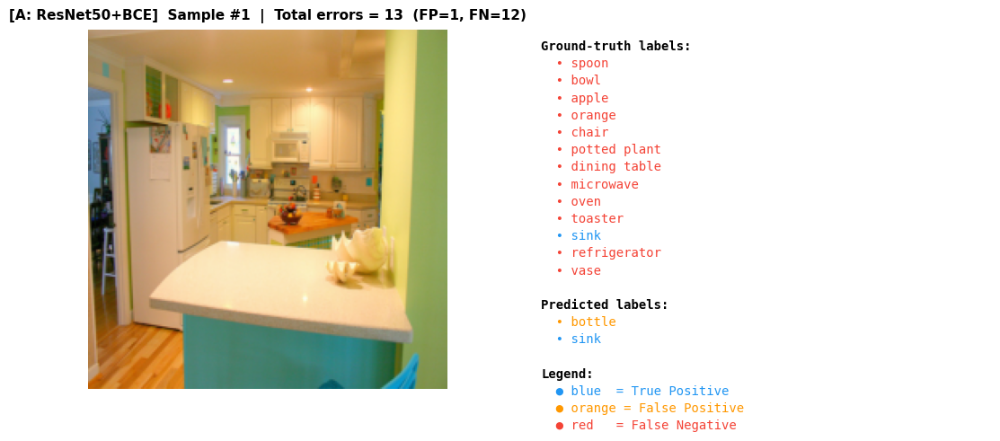

  Saved: /kaggle/working/outputs/vis_exp_A_resnet_bce_rank01.png


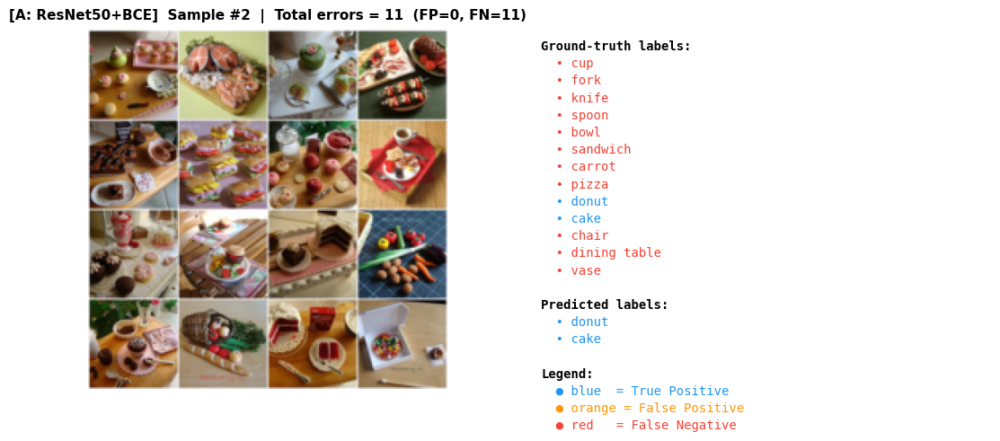

  Saved: /kaggle/working/outputs/vis_exp_A_resnet_bce_rank02.png


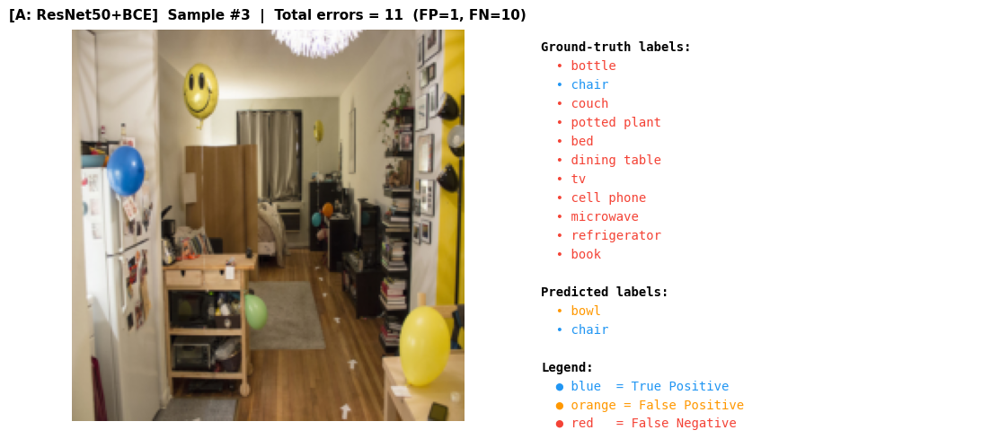

  Saved: /kaggle/working/outputs/vis_exp_A_resnet_bce_rank03.png


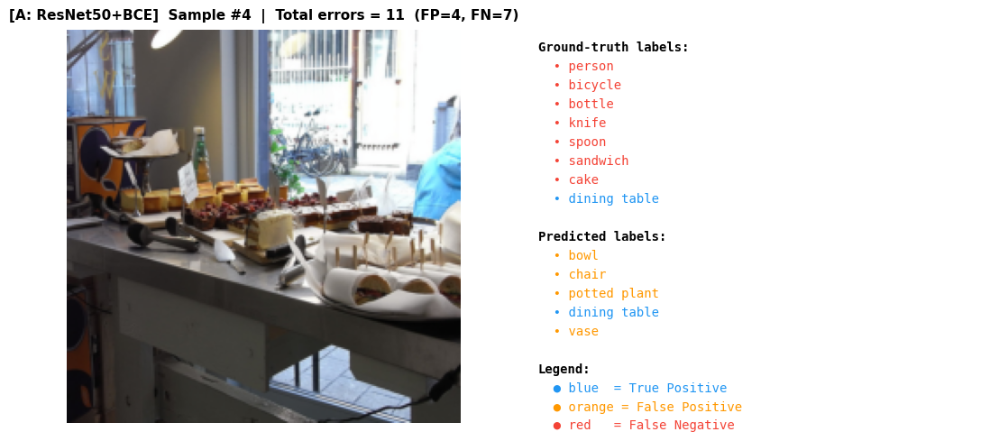

  Saved: /kaggle/working/outputs/vis_exp_A_resnet_bce_rank04.png


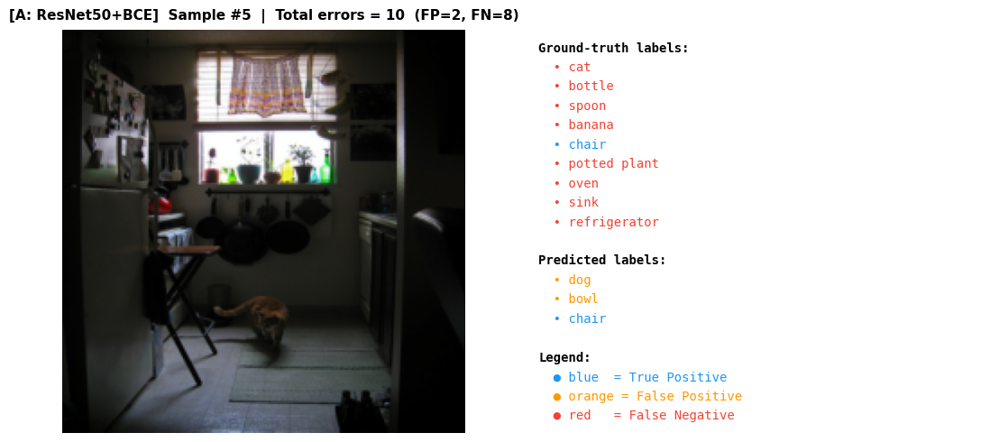

  Saved: /kaggle/working/outputs/vis_exp_A_resnet_bce_rank05.png


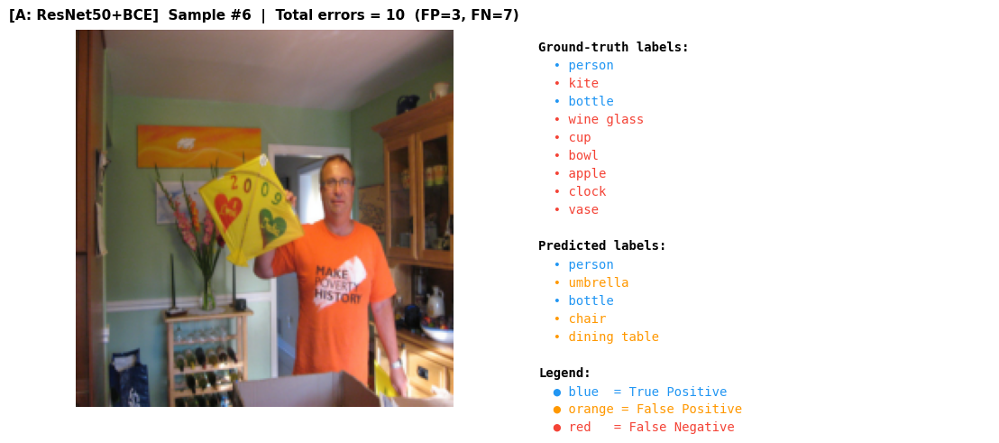

  Saved: /kaggle/working/outputs/vis_exp_A_resnet_bce_rank06.png

=== Visualizing: B: ResNet50+ASL ===
[Model] resnet50 | CBAM=False | Dropout=0.3 | Params=23.67M | FeatChannels=2048

=== B: ResNet50+ASL — Top 6 worst predictions (by FP+FN) ===


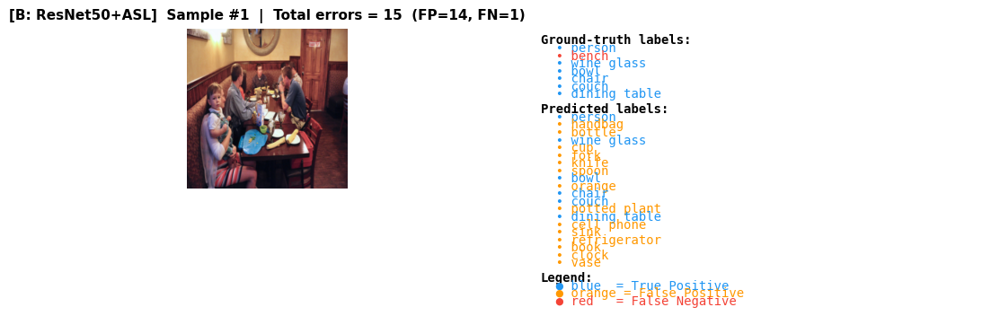

  Saved: /kaggle/working/outputs/vis_exp_B_resnet_asl_rank01.png


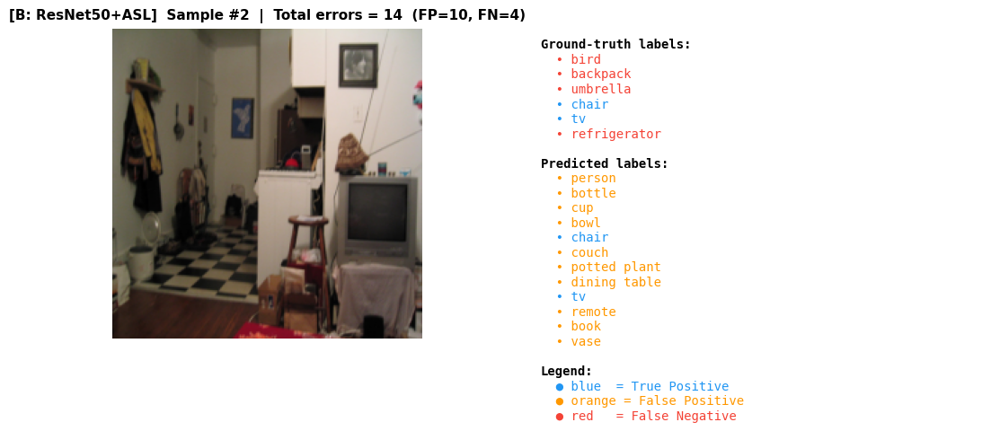

  Saved: /kaggle/working/outputs/vis_exp_B_resnet_asl_rank02.png


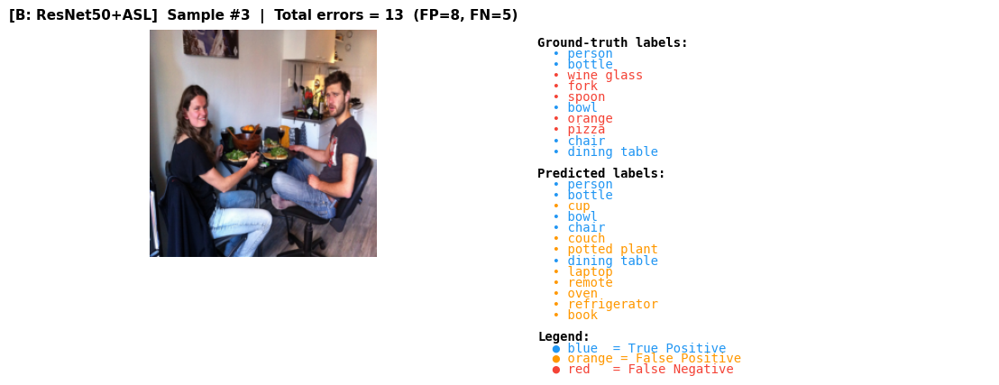

  Saved: /kaggle/working/outputs/vis_exp_B_resnet_asl_rank03.png


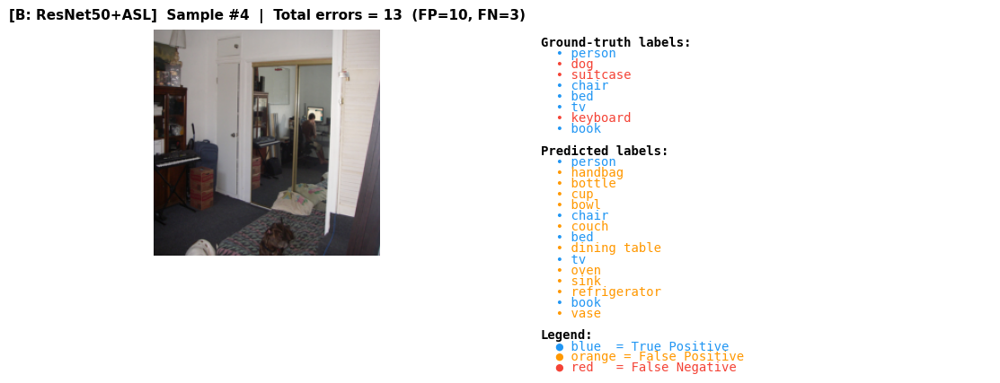

  Saved: /kaggle/working/outputs/vis_exp_B_resnet_asl_rank04.png


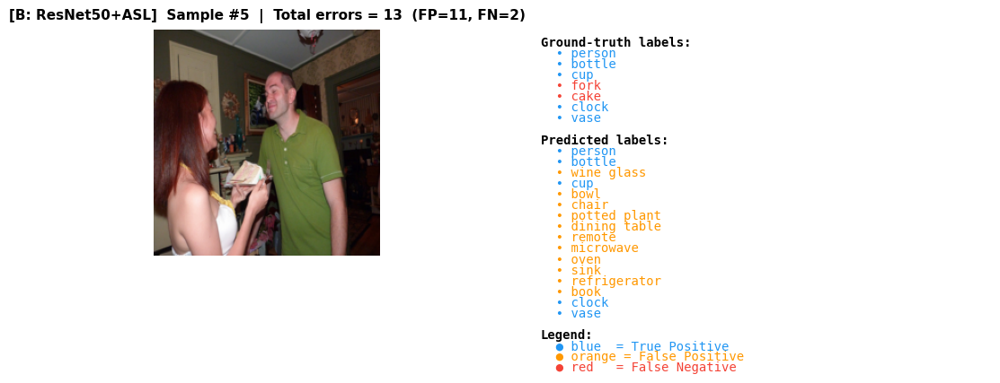

  Saved: /kaggle/working/outputs/vis_exp_B_resnet_asl_rank05.png


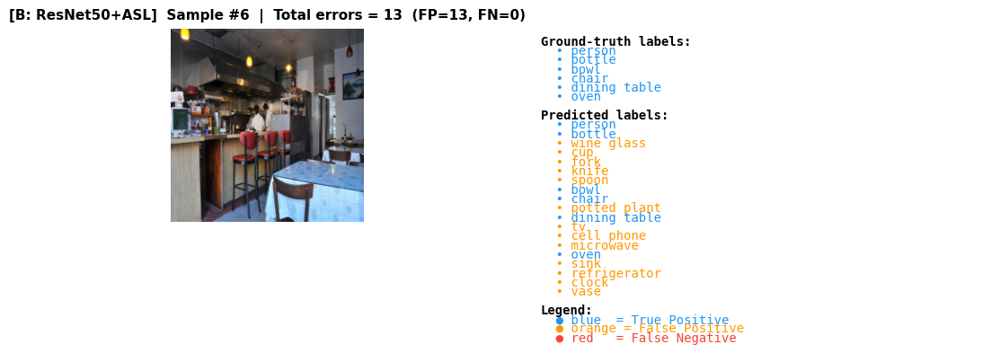

  Saved: /kaggle/working/outputs/vis_exp_B_resnet_asl_rank06.png

=== Visualizing: C: EffNet+CBAM+ASL ===
[Model] efficientnet_b0 | CBAM=True | Dropout=0.3 | Params=3.63M | FeatChannels=320

=== C: EffNet+CBAM+ASL — Top 6 worst predictions (by FP+FN) ===


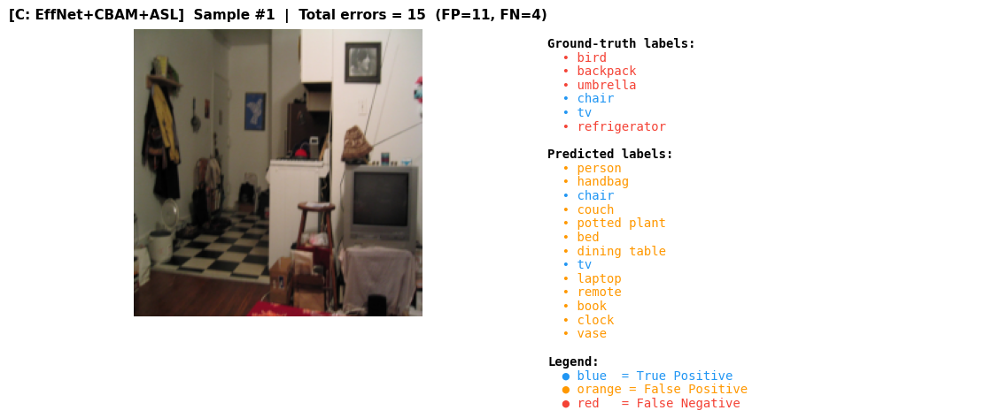

  Saved: /kaggle/working/outputs/vis_exp_C_efficientnet_cbam_asl_rank01.png


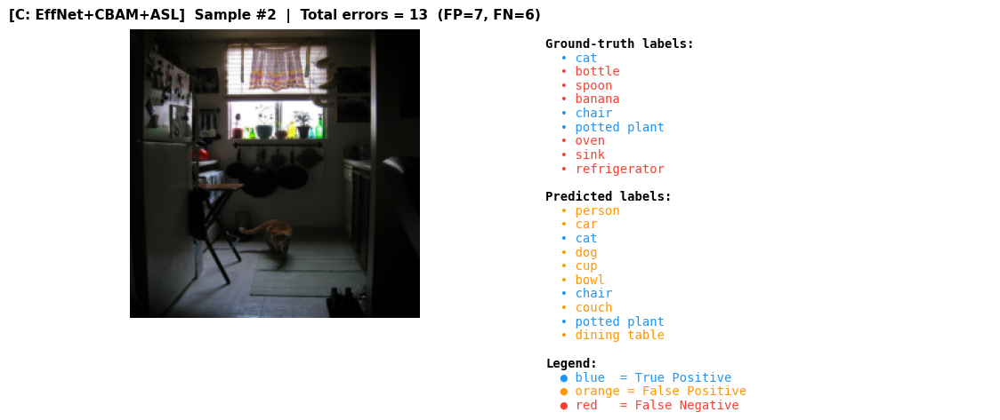

  Saved: /kaggle/working/outputs/vis_exp_C_efficientnet_cbam_asl_rank02.png


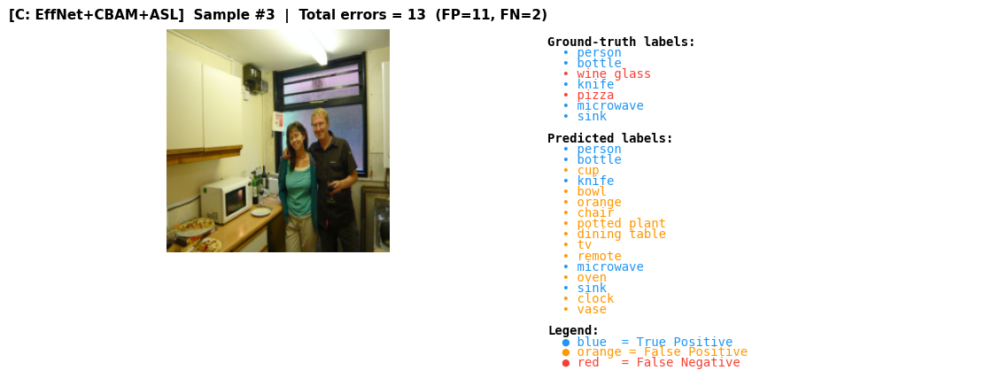

  Saved: /kaggle/working/outputs/vis_exp_C_efficientnet_cbam_asl_rank03.png


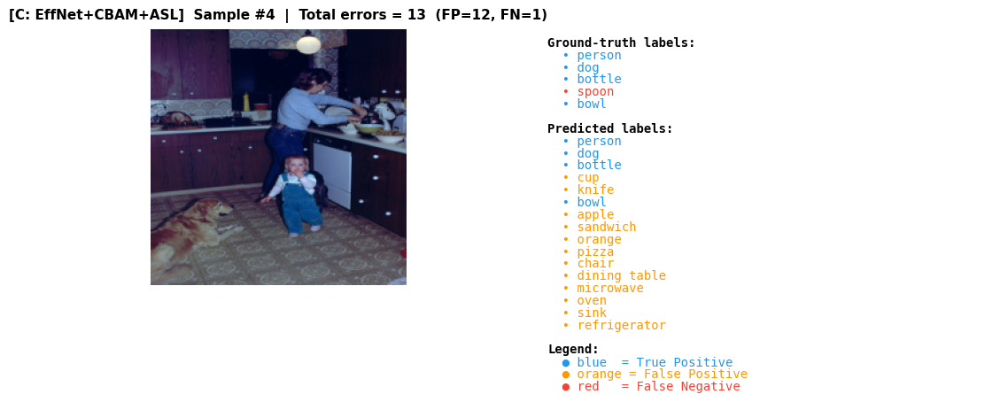

  Saved: /kaggle/working/outputs/vis_exp_C_efficientnet_cbam_asl_rank04.png


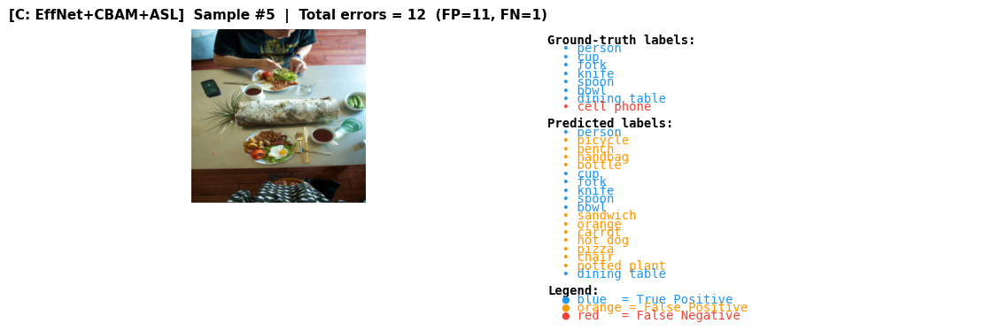

  Saved: /kaggle/working/outputs/vis_exp_C_efficientnet_cbam_asl_rank05.png


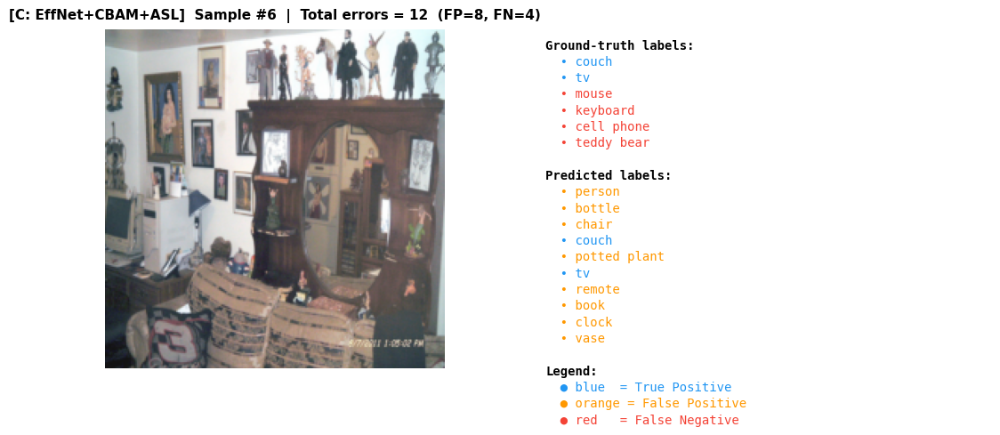

  Saved: /kaggle/working/outputs/vis_exp_C_efficientnet_cbam_asl_rank06.png

=== Visualizing: D: ResNet50+Focal ===
[Model] resnet50 | CBAM=False | Dropout=0.3 | Params=23.67M | FeatChannels=2048

=== D: ResNet50+Focal — Top 6 worst predictions (by FP+FN) ===


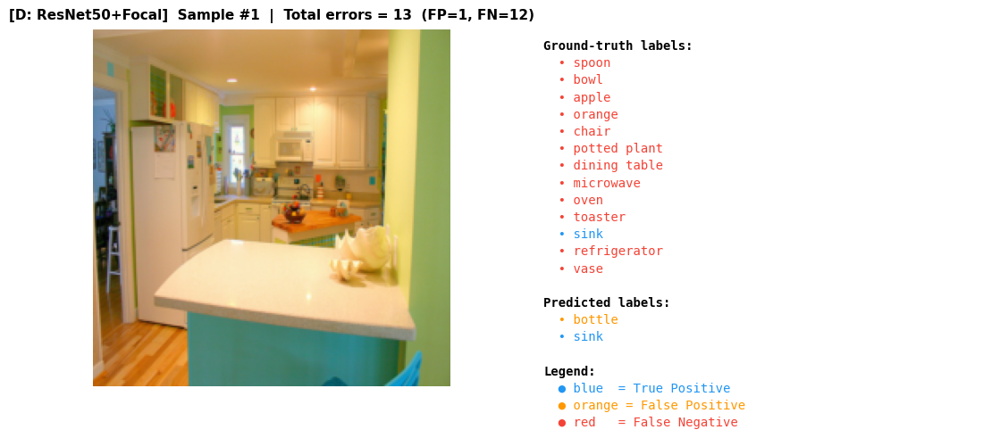

  Saved: /kaggle/working/outputs/vis_exp_D_resnet_focal_rank01.png


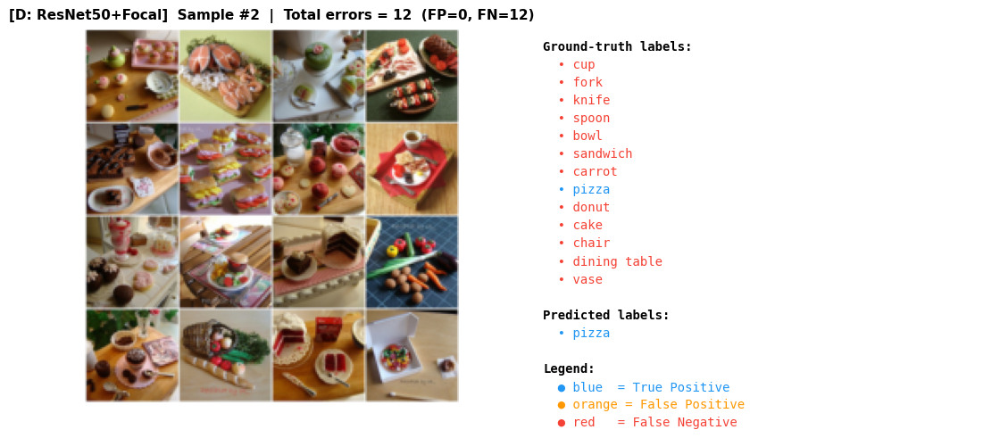

  Saved: /kaggle/working/outputs/vis_exp_D_resnet_focal_rank02.png


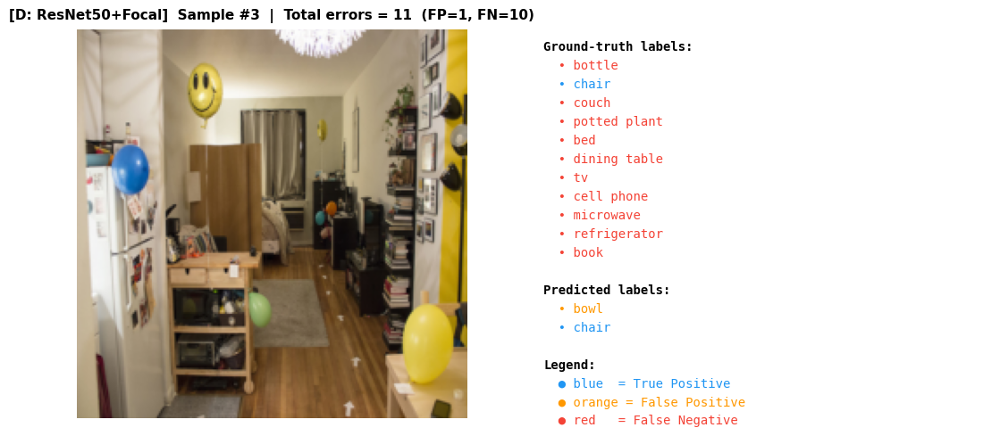

  Saved: /kaggle/working/outputs/vis_exp_D_resnet_focal_rank03.png


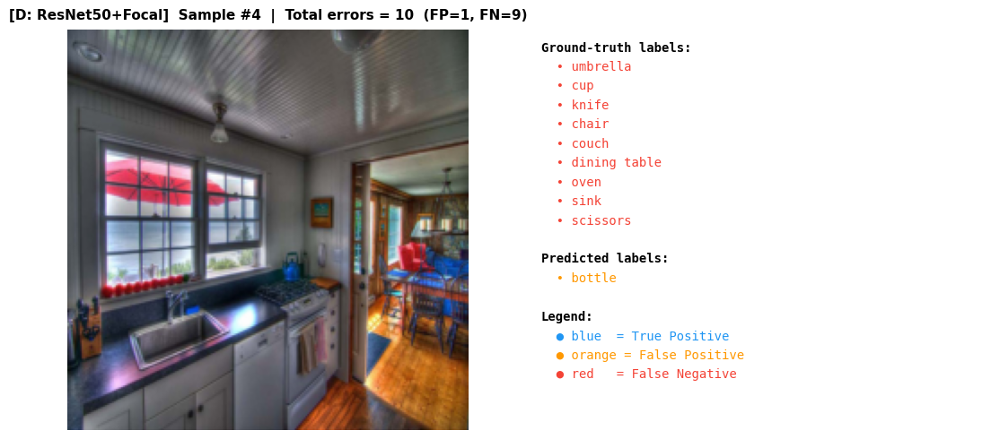

  Saved: /kaggle/working/outputs/vis_exp_D_resnet_focal_rank04.png


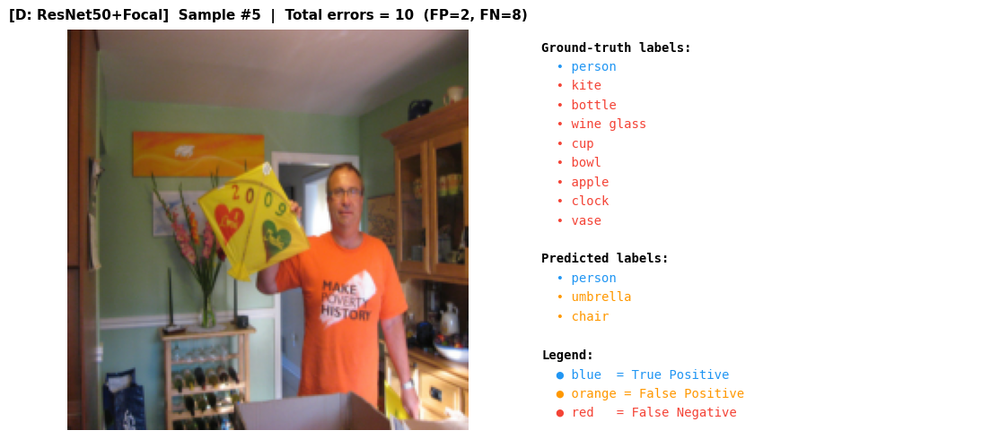

  Saved: /kaggle/working/outputs/vis_exp_D_resnet_focal_rank05.png


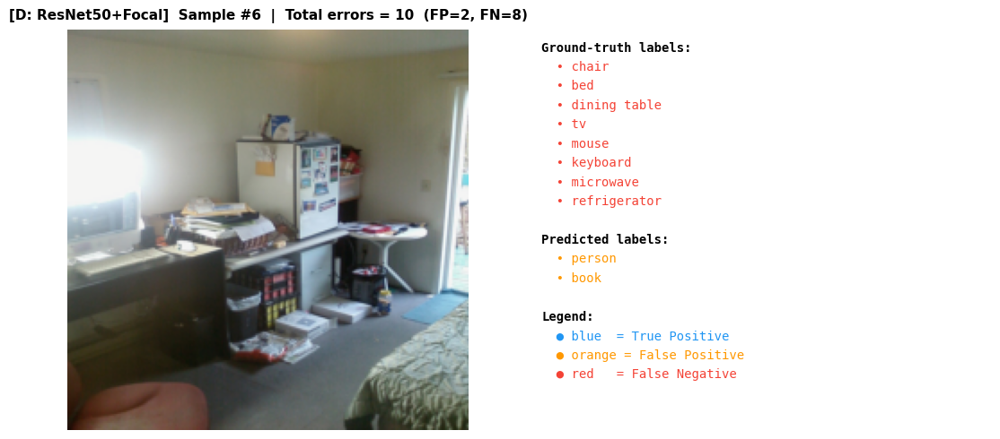

  Saved: /kaggle/working/outputs/vis_exp_D_resnet_focal_rank06.png

=== Visualizing: E: ResNet50+CBAM+ASL ===
[Model] resnet50 | CBAM=True | Dropout=0.3 | Params=24.20M | FeatChannels=2048

=== E: ResNet50+CBAM+ASL — Top 6 worst predictions (by FP+FN) ===


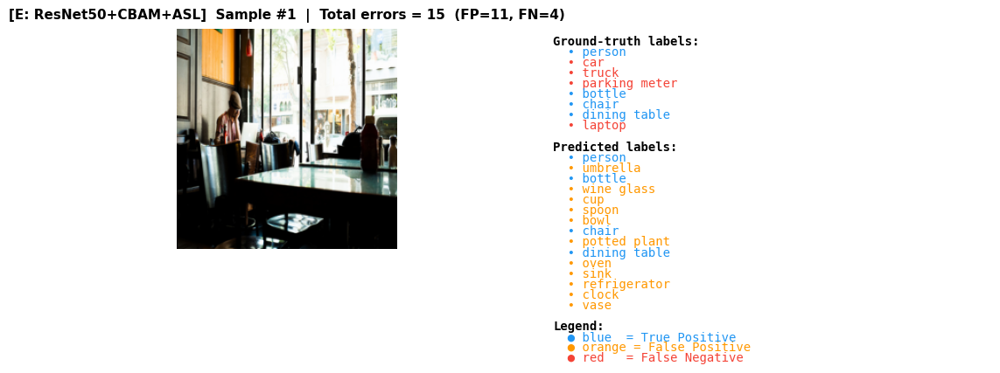

  Saved: /kaggle/working/outputs/vis_exp_E_resnet_cbam_asl_rank01.png


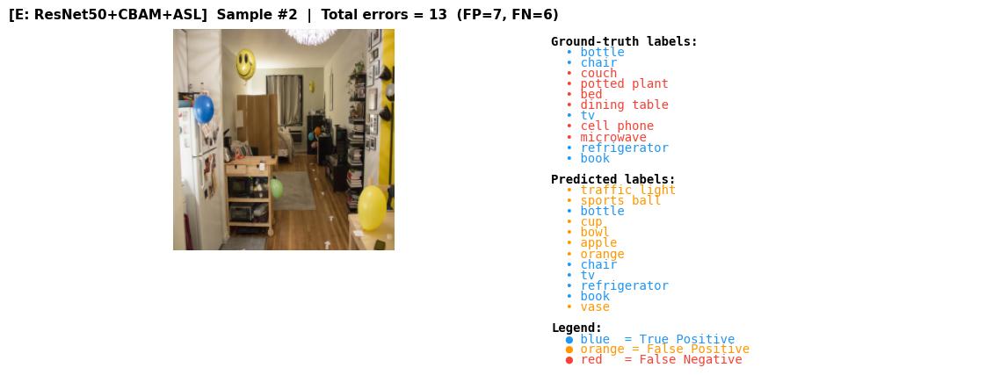

  Saved: /kaggle/working/outputs/vis_exp_E_resnet_cbam_asl_rank02.png


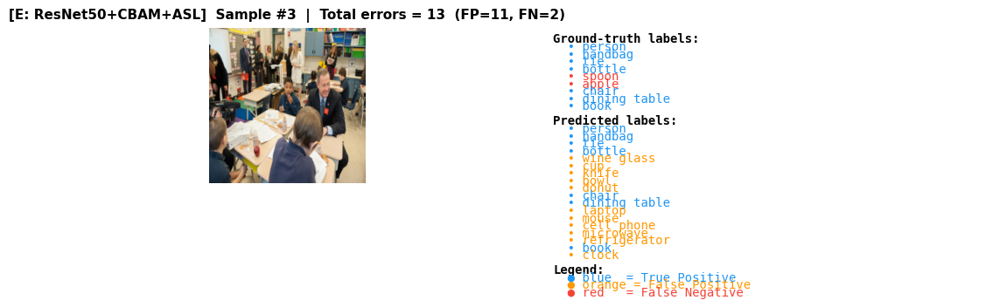

  Saved: /kaggle/working/outputs/vis_exp_E_resnet_cbam_asl_rank03.png


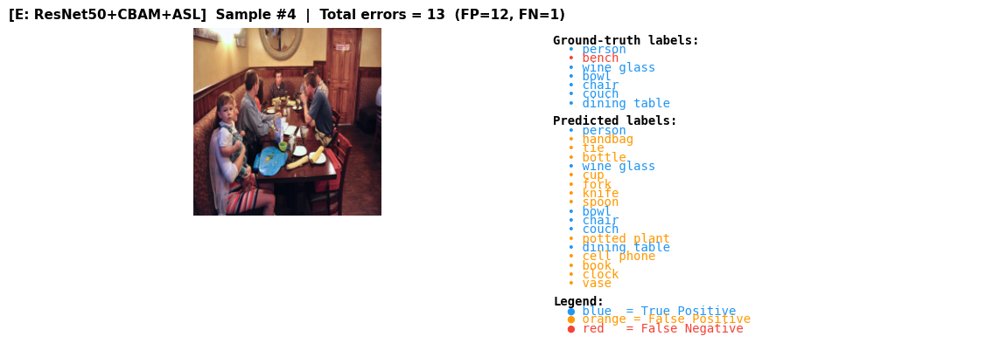

  Saved: /kaggle/working/outputs/vis_exp_E_resnet_cbam_asl_rank04.png


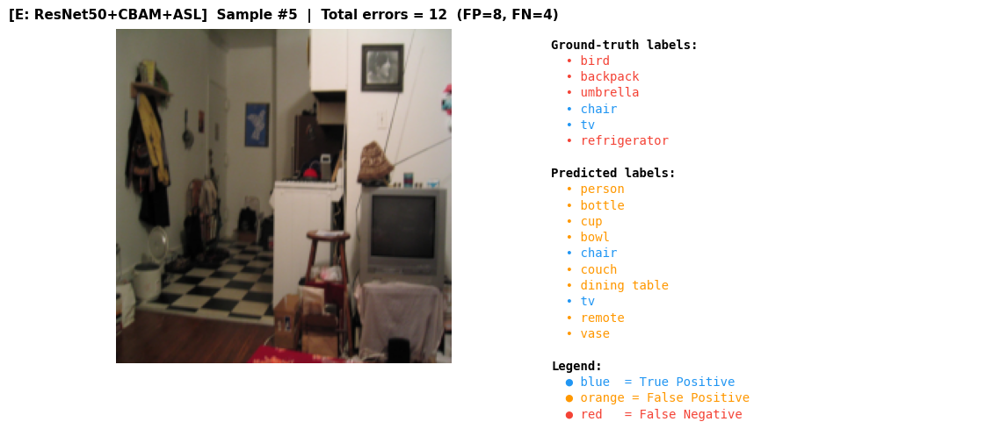

  Saved: /kaggle/working/outputs/vis_exp_E_resnet_cbam_asl_rank05.png


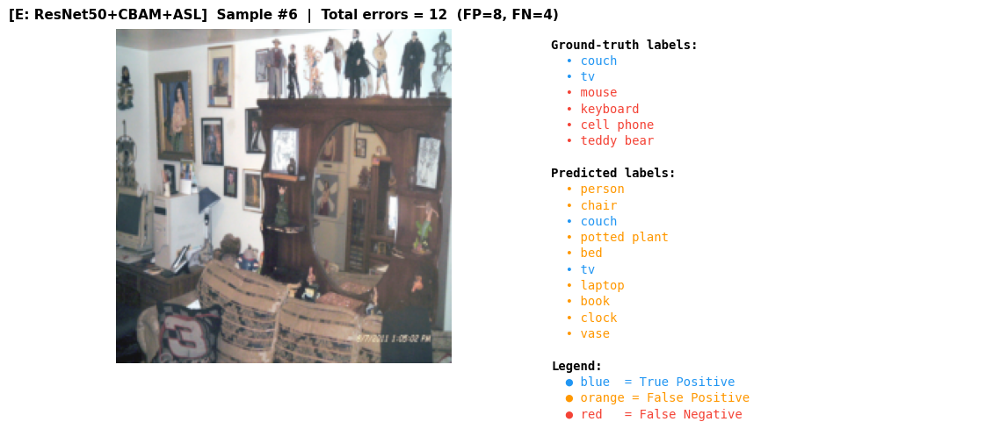

  Saved: /kaggle/working/outputs/vis_exp_E_resnet_cbam_asl_rank06.png

=== Visualizing: F: EffNet+ASL ===
[Model] efficientnet_b0 | CBAM=False | Dropout=0.3 | Params=3.62M | FeatChannels=320

=== F: EffNet+ASL — Top 6 worst predictions (by FP+FN) ===


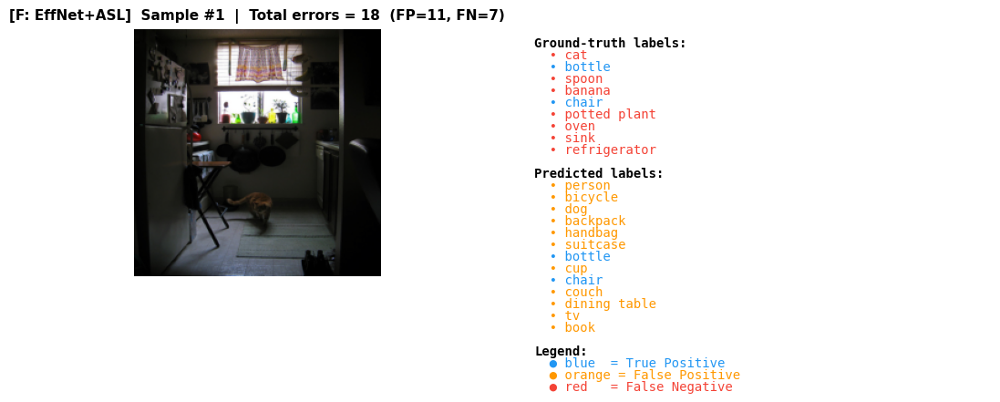

  Saved: /kaggle/working/outputs/vis_exp_F_efficientnet_asl_rank01.png


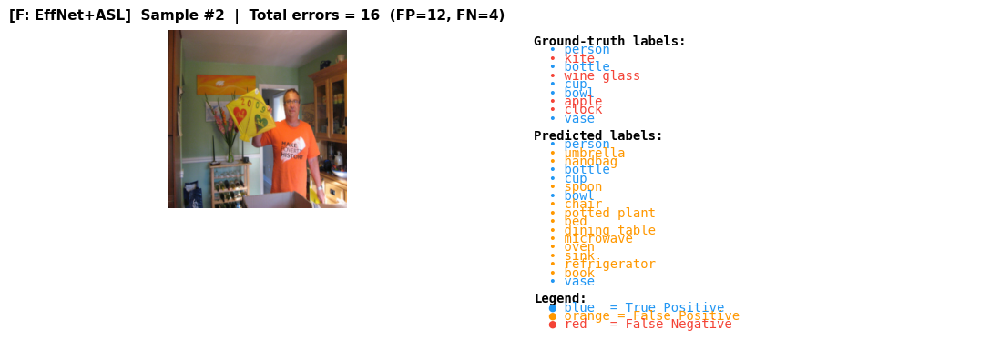

  Saved: /kaggle/working/outputs/vis_exp_F_efficientnet_asl_rank02.png


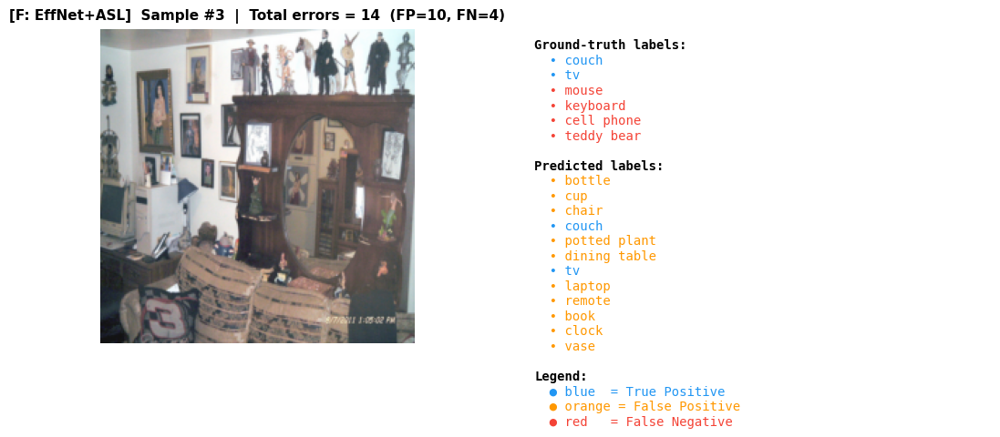

  Saved: /kaggle/working/outputs/vis_exp_F_efficientnet_asl_rank03.png


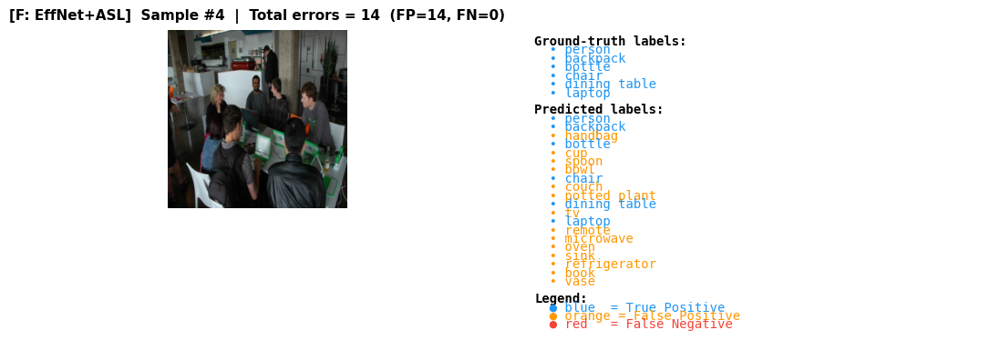

  Saved: /kaggle/working/outputs/vis_exp_F_efficientnet_asl_rank04.png


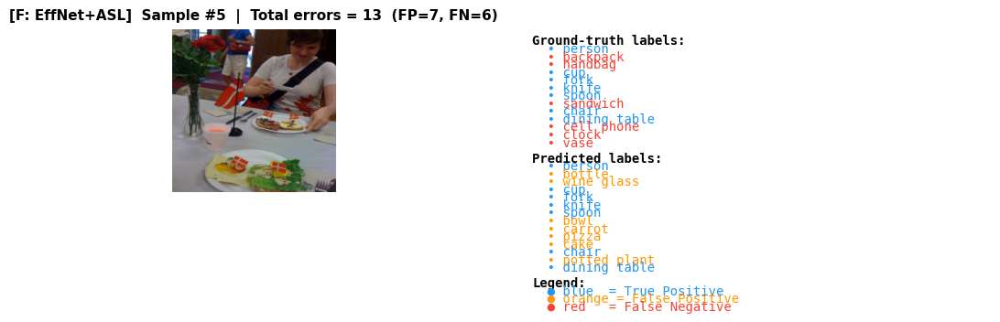

  Saved: /kaggle/working/outputs/vis_exp_F_efficientnet_asl_rank05.png


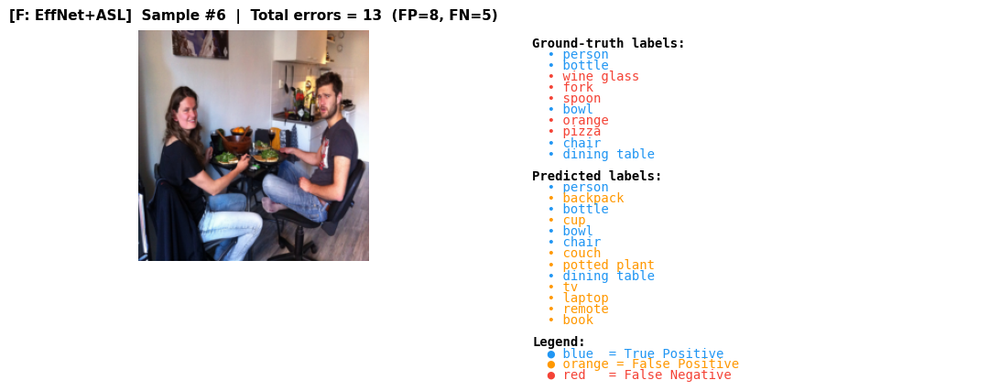

  Saved: /kaggle/working/outputs/vis_exp_F_efficientnet_asl_rank06.png

=== Visualizing: G: EffNet+CBAM+ASL+Aug ===
[Model] efficientnet_b3 | CBAM=True | Dropout=0.3 | Params=10.15M | FeatChannels=384

=== G: EffNet+CBAM+ASL+Aug — Top 6 worst predictions (by FP+FN) ===


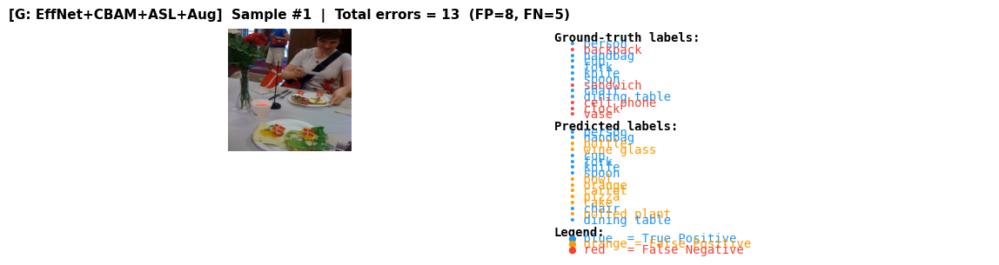

  Saved: /kaggle/working/outputs/vis_exp_G_efficientnet_b3_cbam_asl_rank01.png


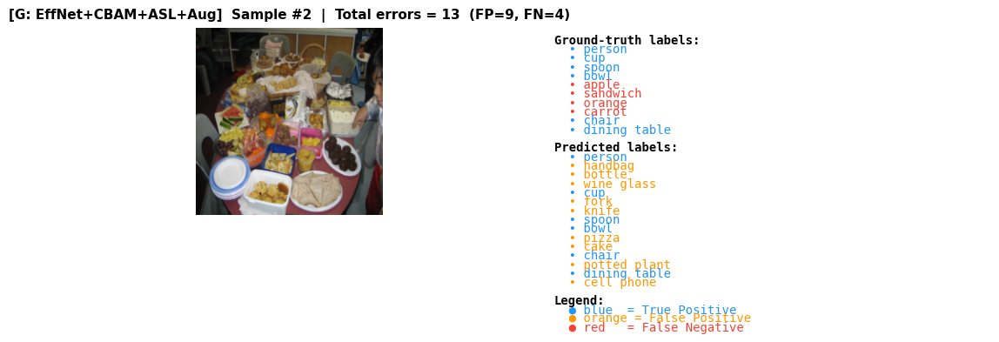

  Saved: /kaggle/working/outputs/vis_exp_G_efficientnet_b3_cbam_asl_rank02.png


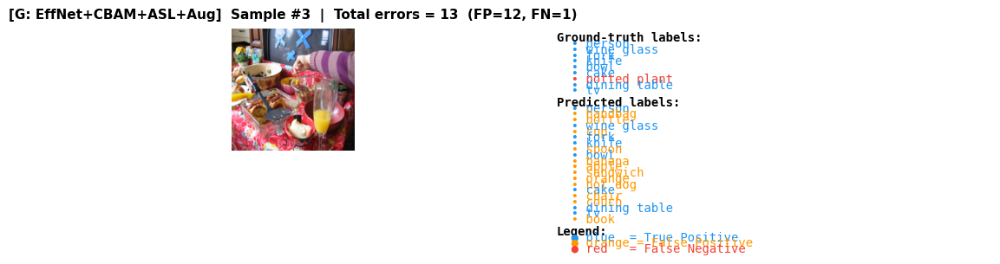

  Saved: /kaggle/working/outputs/vis_exp_G_efficientnet_b3_cbam_asl_rank03.png


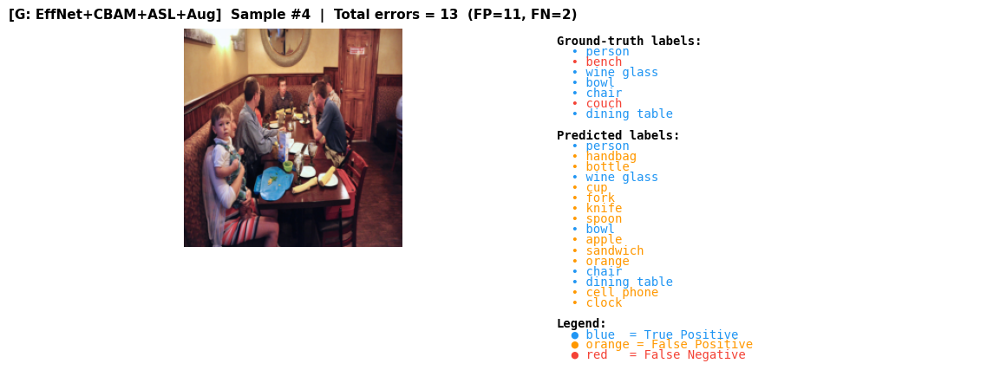

  Saved: /kaggle/working/outputs/vis_exp_G_efficientnet_b3_cbam_asl_rank04.png


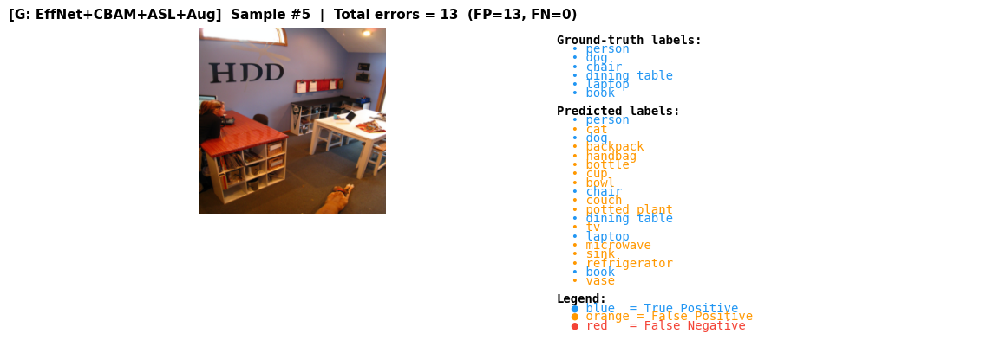

  Saved: /kaggle/working/outputs/vis_exp_G_efficientnet_b3_cbam_asl_rank05.png


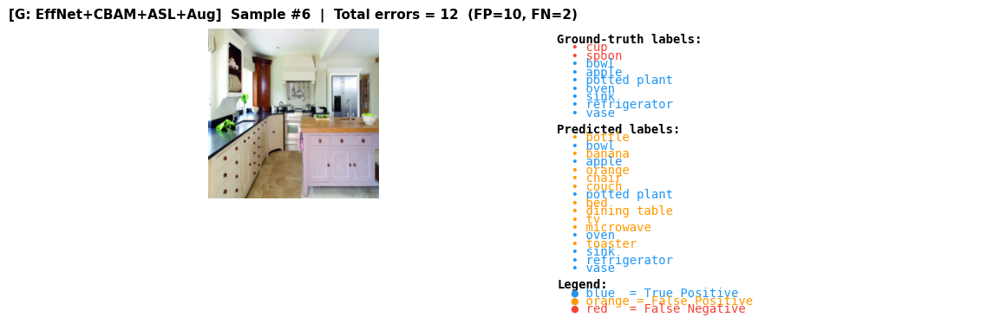

  Saved: /kaggle/working/outputs/vis_exp_G_efficientnet_b3_cbam_asl_rank06.png


In [12]:
import torch, json
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import sys

sys.path.insert(0, str(REPO_DIR / 'src'))
from models import build_model
from dataset import COCOMultiLabelDataset, get_val_transform

COCO_ROOT   = '/kaggle/input/datasets/awsaf49/coco-2017-dataset/coco2017'
OUTPUTS_DIR = Path('/kaggle/working/outputs')
SUBSET_DIR  = Path('/kaggle/working/data/coco_subset')
DEVICE      = 'cuda'

COCO_CATS = [
    'person','bicycle','car','motorcycle','airplane','bus','train','truck','boat','traffic light',
    'fire hydrant','stop sign','parking meter','bench','bird','cat','dog','horse','sheep','cow',
    'elephant','bear','zebra','giraffe','backpack','umbrella','handbag','tie','suitcase','frisbee',
    'skis','snowboard','sports ball','kite','baseball bat','baseball glove','skateboard','surfboard',
    'tennis racket','bottle','wine glass','cup','fork','knife','spoon','bowl','banana','apple',
    'sandwich','orange','broccoli','carrot','hot dog','pizza','donut','cake','chair','couch',
    'potted plant','bed','dining table','toilet','tv','laptop','mouse','remote','keyboard',
    'cell phone','microwave','oven','toaster','sink','refrigerator','book','clock','vase',
    'scissors','teddy bear','hair drier','toothbrush'
]

EXPERIMENTS_VIS = [
    ('A: ResNet50+BCE',       'exp_A_resnet_bce',              'resnet50',        False),
    ('B: ResNet50+ASL',       'exp_B_resnet_asl',              'resnet50',        False),
    ('C: EffNet+CBAM+ASL',    'exp_C_efficientnet_cbam_asl',   'efficientnet_b0', True),
    ('D: ResNet50+Focal',     'exp_D_resnet_focal',            'resnet50',        False),
    ('E: ResNet50+CBAM+ASL',  'exp_E_resnet_cbam_asl',         'resnet50',        True),
    ('F: EffNet+ASL',         'exp_F_efficientnet_asl',        'efficientnet_b0', False),
    ('G: EffNet+CBAM+ASL+Aug','exp_G_efficientnet_b3_cbam_asl','efficientnet_b3', True),
]

THRESHOLD = 0.5
N_SAMPLES  = 6  # worst-case images per experiment

transform = get_val_transform(img_size=224)
test_ids  = json.load(open(SUBSET_DIR / 'subset_test_ids.json'))
test_ds   = COCOMultiLabelDataset(COCO_ROOT, 'val', transform, test_ids)


def denormalize(tensor):
    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])
    img  = tensor.permute(1, 2, 0).numpy()
    img  = img * std + mean
    return np.clip(img, 0, 1)


def visualize_samples(name, exp_dir, backbone, use_cbam):
    pth = OUTPUTS_DIR / exp_dir / 'best.pth'
    if not pth.exists():
        print(f'Skip {name}: no best.pth'); return

    model = build_model({'backbone': backbone, 'use_cbam': use_cbam,
                         'num_classes': 80, 'pretrained': False}).to(DEVICE)
    ckpt  = torch.load(pth, map_location=DEVICE, weights_only=False)
    model.load_state_dict(ckpt['model'] if isinstance(ckpt, dict) and 'model' in ckpt else ckpt)
    model.eval()

    errors = []
    with torch.no_grad():
        for idx in range(min(500, len(test_ds))):
            img_t, target = test_ds[idx]
            logit = model(img_t.unsqueeze(0).to(DEVICE))
            prob  = torch.sigmoid(logit).squeeze().cpu().numpy()
            pred  = (prob >= THRESHOLD).astype(float)
            gt    = target.numpy()
            err   = int(np.sum(np.abs(pred - gt)))
            errors.append((err, idx, img_t, gt, prob, pred))

    errors.sort(key=lambda x: -x[0])
    worst = errors[:N_SAMPLES]

    print(f'\n=== {name} — Top {N_SAMPLES} worst predictions (by FP+FN) ===')
    for rank, (err, idx, img_t, gt, prob, pred) in enumerate(worst, 1):
        img_np      = denormalize(img_t)
        gt_labels   = [COCO_CATS[i] for i in range(80) if gt[i]   > 0.5]
        pred_labels = [COCO_CATS[i] for i in range(80) if pred[i] > 0.5]
        tp = sorted(set(gt_labels) & set(pred_labels))
        fp = sorted(set(pred_labels) - set(gt_labels))
        fn = sorted(set(gt_labels)   - set(pred_labels))

        fig, (ax_img, ax_txt) = plt.subplots(
            1, 2, figsize=(11, 5),
            gridspec_kw={'width_ratios': [1, 1]}
        )

        # --- left: image ---
        ax_img.imshow(img_np)
        ax_img.axis('off')
        ax_img.set_title(
            f'[{name}]  Sample #{rank}  |  Total errors = {err}  (FP={len(fp)}, FN={len(fn)})',
            fontsize=11, fontweight='bold', pad=8
        )

        # --- right: label table ---
        ax_txt.axis('off')
        lines = []
        lines.append(('Ground-truth labels:', 'black', True))
        if gt_labels:
            for lbl in gt_labels:
                color = '#2196F3' if lbl in tp else '#F44336'   # blue=TP, red=FN
                lines.append((f'  • {lbl}', color, False))
        else:
            lines.append(('  (none)', 'grey', False))

        lines.append(('', 'black', False))
        lines.append(('Predicted labels:', 'black', True))
        if pred_labels:
            for lbl in pred_labels:
                color = '#2196F3' if lbl in tp else '#FF9800'   # blue=TP, orange=FP
                lines.append((f'  • {lbl}', color, False))
        else:
            lines.append(('  (none)', 'grey', False))

        lines.append(('', 'black', False))
        # legend
        lines.append(('Legend:', 'black', True))
        lines.append(('  ● blue  = True Positive',  '#2196F3', False))
        lines.append(('  ● orange = False Positive', '#FF9800', False))
        lines.append(('  ● red   = False Negative',  '#F44336', False))

        y = 0.97
        line_h = 0.048
        for text, color, bold in lines:
            weight = 'bold' if bold else 'normal'
            ax_txt.text(
                0.05, y, text,
                transform=ax_txt.transAxes,
                fontsize=10, color=color, fontweight=weight,
                va='top', ha='left', family='monospace'
            )
            y -= line_h

        plt.tight_layout()
        save_path = OUTPUTS_DIR / f'vis_{exp_dir}_rank{rank:02d}.png'
        plt.savefig(str(save_path), dpi=130, bbox_inches='tight')
        plt.show()
        plt.close(fig)
        print(f'  Saved: {save_path}')


for name, exp_dir, backbone, use_cbam in EXPERIMENTS_VIS:
    print(f'\n=== Visualizing: {name} ===')
    visualize_samples(name, exp_dir, backbone, use_cbam)


## Bước 13: Co-occurrence Heatmap (Phi-coefficient)

Đo mức độ đồng xuất hiện giữa các cặp class trong tập train. FP analysis dùng **Exp G** (best model).


[COCO 2017 train] 16,000 images loaded
Train labels loaded: (16000, 80)


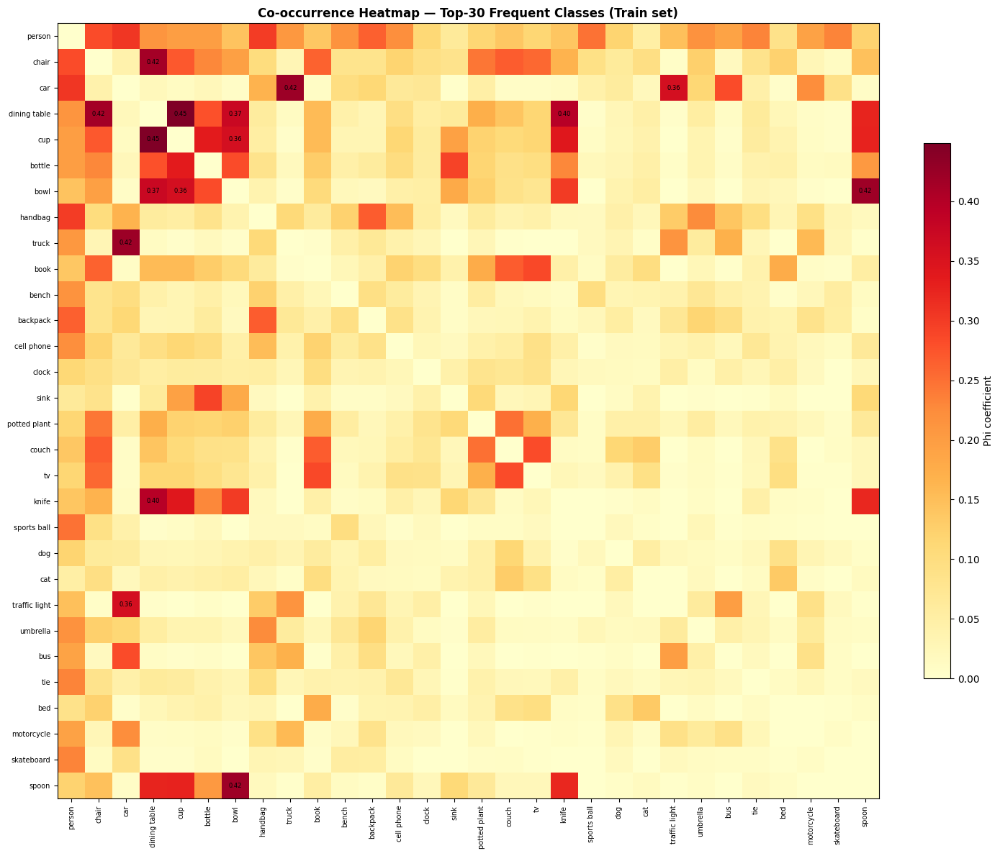

Top-10 co-occurring pairs:
  baseball bat         <-> baseball glove        phi=0.686
  mouse                <-> keyboard              phi=0.630
  toilet               <-> sink                  phi=0.488
  sports ball          <-> tennis racket         phi=0.483
  microwave            <-> oven                  phi=0.450
  cup                  <-> dining table          phi=0.449
  fork                 <-> knife                 phi=0.441
  car                  <-> truck                 phi=0.421
  spoon                <-> bowl                  phi=0.420
  chair                <-> dining table          phi=0.415
[COCO 2017 val] 3,952 images loaded
[Model] efficientnet_b3 | CBAM=True | Dropout=0.3 | Params=10.15M | FeatChannels=384

Top-10 FP confusion pairs (Exp G):
  Predict [handbag             ] when GT=[person              ]  count=346
  Predict [chair               ] when GT=[person              ]  count=242
  Predict [backpack            ] when GT=[person              ]  count=239
 

In [13]:
# ── Co-occurrence Heatmap ────────────────────────────────────
# Multi-label: không có confusion matrix chuẩn.
# Thay bằng Phi-coefficient co-occurrence giữa các cặp class.
import numpy as np, json, sys, torch
import matplotlib.pyplot as plt
from pathlib import Path

sys.path.insert(0, str(REPO_DIR / 'src'))
from dataset import COCOMultiLabelDataset, get_val_transform
from models import build_model

COCO_ROOT  = '/kaggle/input/datasets/awsaf49/coco-2017-dataset/coco2017'
SUBSET_DIR = Path('/kaggle/working/data/coco_subset')
OUTPUTS_DIR= Path('/kaggle/working/outputs')
DEVICE     = 'cuda' if torch.cuda.is_available() else 'cpu'

COCO_CATS = [
    'person','bicycle','car','motorcycle','airplane','bus','train','truck','boat',
    'traffic light','fire hydrant','stop sign','parking meter','bench','bird',
    'cat','dog','horse','sheep','cow','elephant','bear','zebra','giraffe',
    'backpack','umbrella','handbag','tie','suitcase','frisbee','skis','snowboard',
    'sports ball','kite','baseball bat','baseball glove','skateboard','surfboard',
    'tennis racket','bottle','wine glass','cup','fork','knife','spoon','bowl',
    'banana','apple','sandwich','orange','broccoli','carrot','hot dog','pizza',
    'donut','cake','chair','couch','potted plant','bed','dining table','toilet',
    'tv','laptop','mouse','remote','keyboard','cell phone','microwave','oven',
    'toaster','sink','refrigerator','book','clock','vase','scissors','teddy bear',
    'hair drier','toothbrush'
]

# Load train labels
transform = get_val_transform(img_size=224)
train_ids = json.load(open(SUBSET_DIR / 'subset_train_ids.json'))
train_ds  = COCOMultiLabelDataset(COCO_ROOT, 'train', transform, train_ids)
labels = np.array([lbl.numpy() for _, lbl in train_ds])  # (N,80)
N = len(labels)
print(f'Train labels loaded: {labels.shape}')

# Phi co-occurrence
freq  = labels.sum(0) / N
cooc  = (labels.T @ labels) / N
denom = np.sqrt(np.outer(freq, freq))
denom[denom == 0] = 1
phi   = cooc / denom
np.fill_diagonal(phi, 0)

# Top-30 frequent classes
top30  = np.argsort(freq)[::-1][:30]
phi30  = phi[np.ix_(top30, top30)]
cats30 = [COCO_CATS[i] for i in top30]

fig, ax = plt.subplots(figsize=(14, 12))
im = ax.imshow(phi30, cmap='YlOrRd', aspect='auto')
ax.set_xticks(range(30)); ax.set_xticklabels(cats30, rotation=90, fontsize=7)
ax.set_yticks(range(30)); ax.set_yticklabels(cats30, fontsize=7)
plt.colorbar(im, ax=ax, fraction=0.03, label='Phi coefficient')
ax.set_title('Co-occurrence Heatmap — Top-30 Frequent Classes (Train set)',
             fontsize=12, fontweight='bold')
for i in range(30):
    for j in range(30):
        if phi30[i,j] > 0.35:
            ax.text(j, i, f'{phi30[i,j]:.2f}', ha='center', va='center', fontsize=6)
plt.tight_layout()
plt.savefig(str(OUTPUTS_DIR / 'cooccurrence_heatmap.png'), dpi=120)
plt.show()

pairs = sorted([(phi[i,j], COCO_CATS[i], COCO_CATS[j])
                for i in range(80) for j in range(i+1,80)], reverse=True)
print('Top-10 co-occurring pairs:')
for v,a,b in pairs[:10]: print(f'  {a:20s} <-> {b:20s}  phi={v:.3f}')

# FP analysis with Exp G
pth = OUTPUTS_DIR / 'exp_G_efficientnet_b3_cbam_asl' / 'best.pth'
if pth.exists():
    test_ids = json.load(open(SUBSET_DIR / 'subset_test_ids.json'))
    test_ds  = COCOMultiLabelDataset(COCO_ROOT, 'val', transform, test_ids)
    loader   = torch.utils.data.DataLoader(test_ds, batch_size=64, num_workers=2)
    model    = build_model({'backbone':'efficientnet_b3','use_cbam':True,
                            'num_classes':80,'pretrained':False}).to(DEVICE)
    ckpt = torch.load(pth, map_location=DEVICE, weights_only=False)
    model.load_state_dict(ckpt['model'] if 'model' in ckpt else ckpt)
    model.eval()
    all_p, all_t = [], []
    with torch.no_grad():
        for imgs, tgts in loader:
            all_p.append(torch.sigmoid(model(imgs.to(DEVICE))).cpu().numpy())
            all_t.append(tgts.numpy())
    P = np.concatenate(all_p); T = np.concatenate(all_t)
    pred = (P >= 0.5).astype(int)
    FP_mat = np.zeros((80, 80), dtype=int)
    for n in range(len(T)):
        fp  = np.where((pred[n]==1) & (T[n]==0))[0]
        gt  = np.where(T[n]==1)[0]
        for f in fp:
            for g in gt: FP_mat[f, g] += 1
    fp_pairs = sorted([(FP_mat[i,j], COCO_CATS[i], COCO_CATS[j])
                       for i in range(80) for j in range(80) if i!=j and FP_mat[i,j]>0],
                      reverse=True)
    print('\nTop-10 FP confusion pairs (Exp G):')
    for cnt,a,b in fp_pairs[:10]:
        print(f'  Predict [{a:20s}] when GT=[{b:20s}]  count={cnt}')
else:
    print('Exp G best.pth not found')

## Bước 14: t-SNE — Trực Quan Hóa Không Gian Đặc Trưng (Exp G)

Trích xuất GAP vector 384-dim từ **Exp G** (EfficientNet-B3 + CBAM), giảm chiều bằng PCA → t-SNE.


[Model] efficientnet_b3 | CBAM=True | Dropout=0.3 | Params=10.15M | FeatChannels=384
[COCO 2017 val] 1,000 images loaded
Features: (1000, 384), Labels: (1000, 80)
PCA 384->50...
PCA variance: 74.9%
t-SNE 50->2 (may take ~2min)...


/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


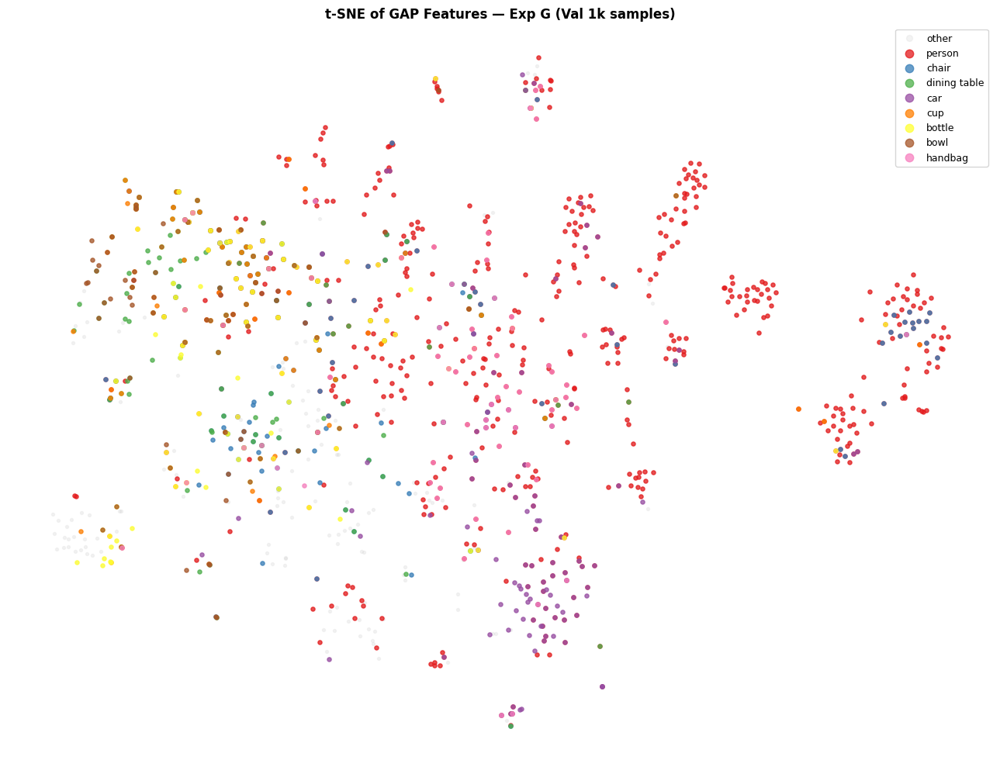

Saved: tsne_features_expG.png

Intra vs Inter cosine distance (top-5 classes):
  Class                    Intra     Inter  Overlap?
  person                  0.7567    0.8608  YES (confused)
  chair                   0.7734    0.8211  YES (confused)
  dining table            0.7389    0.8386  YES (confused)
  car                     0.6873    0.8433  YES (confused)
  cup                     0.7355    0.8192  YES (confused)


In [14]:
# ── t-SNE Feature Space Visualization ────────────────────────
# Extract GAP vectors (384-dim) -> PCA(50) -> t-SNE(2D)
import torch, json, sys
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_distances

sys.path.insert(0, str(REPO_DIR / 'src'))
from models import build_model
from dataset import COCOMultiLabelDataset, get_val_transform

COCO_ROOT  = '/kaggle/input/datasets/awsaf49/coco-2017-dataset/coco2017'
SUBSET_DIR = Path('/kaggle/working/data/coco_subset')
OUTPUTS_DIR= Path('/kaggle/working/outputs')
DEVICE     = 'cuda' if torch.cuda.is_available() else 'cpu'

COCO_CATS = [
    'person','bicycle','car','motorcycle','airplane','bus','train','truck','boat',
    'traffic light','fire hydrant','stop sign','parking meter','bench','bird',
    'cat','dog','horse','sheep','cow','elephant','bear','zebra','giraffe',
    'backpack','umbrella','handbag','tie','suitcase','frisbee','skis','snowboard',
    'sports ball','kite','baseball bat','baseball glove','skateboard','surfboard',
    'tennis racket','bottle','wine glass','cup','fork','knife','spoon','bowl',
    'banana','apple','sandwich','orange','broccoli','carrot','hot dog','pizza',
    'donut','cake','chair','couch','potted plant','bed','dining table','toilet',
    'tv','laptop','mouse','remote','keyboard','cell phone','microwave','oven',
    'toaster','sink','refrigerator','book','clock','vase','scissors','teddy bear',
    'hair drier','toothbrush'
]

pth = OUTPUTS_DIR / 'exp_G_efficientnet_b3_cbam_asl' / 'best.pth'
if not pth.exists():
    print('Exp G best.pth not found'); raise SystemExit

model = build_model({'backbone':'efficientnet_b3','use_cbam':True,
                     'num_classes':80,'pretrained':False}).to(DEVICE)
ckpt  = torch.load(pth, map_location=DEVICE, weights_only=False)
model.load_state_dict(ckpt['model'] if 'model' in ckpt else ckpt)
model.eval()

# Hook on GAP (adaptive_avg_pool before FC)
captured = {}
def hook_fn(m, inp, out):
    v = out.detach().cpu()
    captured['feat'] = v.flatten(1)  # (B, 1280)
hook = model.gap.register_forward_hook(hook_fn)

transform  = get_val_transform(img_size=224)
val_ids    = json.load(open(SUBSET_DIR / 'subset_val_ids.json'))
val_ds     = COCOMultiLabelDataset(COCO_ROOT, 'val', transform, val_ids)
val_loader = torch.utils.data.DataLoader(val_ds, batch_size=64, num_workers=2)

feats, lbls = [], []
with torch.no_grad():
    for imgs, tgts in val_loader:
        _ = model(imgs.to(DEVICE))
        feats.append(captured['feat'].numpy())
        lbls.append(tgts.numpy())
hook.remove()

F = np.concatenate(feats, 0)   # (N,1280)
L = np.concatenate(lbls,  0)   # (N,80)
print(f'Features: {F.shape}, Labels: {L.shape}')

# PCA -> t-SNE
print('PCA 384->50...')
pca = PCA(n_components=50, random_state=42)
F50 = pca.fit_transform(F)
print(f'PCA variance: {pca.explained_variance_ratio_.sum():.1%}')
print('t-SNE 50->2 (may take ~2min)...')
tsne = TSNE(n_components=2, perplexity=40, n_iter=1000, random_state=42, verbose=0)
F2   = tsne.fit_transform(F50)

# Plot coloured by top-8 frequent classes
freq_order   = np.argsort(L.sum(0))[::-1][:8]
label_colors = plt.cm.Set1(np.linspace(0, 0.85, 8))

fig, ax = plt.subplots(figsize=(13, 10))
ax.scatter(F2[:,0], F2[:,1], c='lightgray', s=8, alpha=0.25, label='other')
for k, ci in enumerate(freq_order):
    mask = L[:, ci] == 1
    ax.scatter(F2[mask,0], F2[mask,1], c=[label_colors[k]], s=14,
               alpha=0.75, label=COCO_CATS[ci])
ax.set_title('t-SNE of GAP Features — Exp G (Val 1k samples)',
             fontsize=12, fontweight='bold')
ax.legend(markerscale=2, fontsize=9)
ax.axis('off')
plt.tight_layout()
plt.savefig(str(OUTPUTS_DIR / 'tsne_features_expG.png'), dpi=120)
plt.show()
print('Saved: tsne_features_expG.png')

# Intra vs Inter cosine distance per class
print('\nIntra vs Inter cosine distance (top-5 classes):')
print(f'  {"Class":20s}  {"Intra":>8}  {"Inter":>8}  Overlap?')
for ci in freq_order[:5]:
    cf  = F[L[:,ci]==1]
    oth = F[L[:,ci]==0][:300]
    if len(cf) < 2: continue
    intra = cosine_distances(cf).mean()
    inter = cosine_distances(cf, oth).mean()
    ov    = 'YES (confused)' if intra > 0.5 * inter else 'NO (clear cluster)'
    print(f'  {COCO_CATS[ci]:20s}  {intra:8.4f}  {inter:8.4f}  {ov}')

## Bước 15: Đóng Gói Kết Quả

Zip toàn bộ `outputs/` (bỏ `.pth`) để tải về từ Kaggle.


In [15]:
import os
print('Zipping results (excluding .pth to keep size small)...')
!zip -q -r /kaggle/working/ecaal_eval_results.zip /kaggle/working/outputs -x "*.pth"
print('Done! Download: /kaggle/working/ecaal_eval_results.zip')


Zipping results (excluding .pth to keep size small)...
Done! Download: /kaggle/working/ecaal_eval_results.zip
